In [1]:
import numpy as np
import pandas as pd
import sklearn as sk
from pandas import Series,DataFrame
import matplotlib.pyplot as plt
import seaborn as sns
import os
from datetime import datetime
from collections import Counter
import re
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn import tree
from sklearn.metrics import roc_auc_score, accuracy_score, confusion_matrix, classification_report, roc_curve
from IPython.display import Image
import pydotplus
from sklearn.ensemble import RandomForestRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import AdaBoostRegressor


In [2]:
booking_data = pd.read_csv('booking_data.csv')
expedia_data = pd.read_csv('expedia_data.csv')

# Adding suffixes to column names in the source file
booking_data.columns = [col + '_book' for col in booking_data.columns]
expedia_data.columns = [col + '_exp' for col in expedia_data.columns]

# Joining data according to the common key
merged_data = pd.merge(booking_data, expedia_data, left_on=['name_book', 'LOS_book', 'TTT_book', 'Snapshot Date_book'],
                       right_on=['name_exp', 'LOS_exp', 'TTT_exp', 'Snapshot Date_exp'])

merged_data.to_csv('merged_data.csv', index=False)

In [3]:
merged_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23816 entries, 0 to 23815
Data columns (total 77 columns):
 #   Column                                          Non-Null Count  Dtype  
---  ------                                          --------------  -----  
 0   name_book                                       23816 non-null  object 
 1   grade_book                                      23816 non-null  float64
 2   descriptive_grades_book                         23816 non-null  int64  
 3   num_of_reviews_book                             23816 non-null  float64
 4   breakfast_book                                  23816 non-null  int64  
 5   distance_from_center_book                       23816 non-null  float64
 6   stars_book                                      23816 non-null  float64
 7   price_book                                      23816 non-null  int64  
 8   free_cancellation_book                          23816 non-null  int64  
 9   no_prepayment_book                     

In [4]:
# Adding a field for price differences between the two sites
merged_data['price_diff'] = merged_data['price_book'] - merged_data['price_exp']

# Handling the hotel name field
# Creating a LabelEncoder object
label_encoder = LabelEncoder()

# Convert names to numeric identifiers
merged_data['hotel_id'] = label_encoder.fit_transform(merged_data['name_book'])

# Adding additional features using existing variables
######################################
def convert_to_date(date_str):
    return datetime.strptime(date_str, '%Y-%m-%d')

merged_data['checkin_date_book'] = merged_data['checkin_date_book'].apply(convert_to_date)
def get_day_of_week(date_obj):
    day_of_week = date_obj.weekday()
    return day_of_week

merged_data['checkin_day_week'] = merged_data['checkin_date_book'].apply(get_day_of_week)

# Adding an additional feature to the bed type that will give an indication of whether it is a couple (or more) in a room or a single person
def classify_bed_type(value):
    if value == 7 or value == 8:
        return 1
    else:
        return 0

merged_data['two_beds'] = merged_data['bed_category_book'].apply(classify_bed_type)

In [5]:
merged_data = merged_data.drop(['name_book', 'name_exp' , 'price_book', 'price_exp', 'current_price_exp', 'price_after_taxes_exp', 'TTT_exp', 'LOS_exp', 'checkin_date_book', 'checkin_date_exp' ,'checkout_date_book', 'checkout_date_exp', 'Snapshot Date_book', 'Snapshot Date_exp'], axis=1)

In [6]:
merged_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23816 entries, 0 to 23815
Data columns (total 67 columns):
 #   Column                                          Non-Null Count  Dtype  
---  ------                                          --------------  -----  
 0   grade_book                                      23816 non-null  float64
 1   descriptive_grades_book                         23816 non-null  int64  
 2   num_of_reviews_book                             23816 non-null  float64
 3   breakfast_book                                  23816 non-null  int64  
 4   distance_from_center_book                       23816 non-null  float64
 5   stars_book                                      23816 non-null  float64
 6   free_cancellation_book                          23816 non-null  int64  
 7   no_prepayment_book                              23816 non-null  int64  
 8   TTT_book                                        23816 non-null  int64  
 9   LOS_book                               

In [7]:
# From the above, it can be seen that the data ranges for the "Number of Reviews" variable and the "Distance from Center" variable are different from the rest, so we will normalize them.
columns_to_normalize = ['distance_from_center_book', 'num_of_reviews_book', 'num_reviews_exp']

min_max_scaler = MinMaxScaler()
data_min_max_scaled = merged_data.copy()
data_min_max_scaled[columns_to_normalize] = min_max_scaler.fit_transform(merged_data[columns_to_normalize])

standard_scaler = StandardScaler()
data_standard_scaled = merged_data.copy()
data_standard_scaled[columns_to_normalize] = standard_scaler.fit_transform(merged_data[columns_to_normalize])

print("Original Data:")
print(merged_data[columns_to_normalize].head())

print("\nMin-Max Scaled Data:")
print(data_min_max_scaled[columns_to_normalize].head())

print("\nStandard Scaled Data:")
print(data_standard_scaled[columns_to_normalize].head())

Original Data:
   distance_from_center_book  num_of_reviews_book  num_reviews_exp
0                        1.9               4667.0            625.0
1                        6.9                534.0            469.0
2                        1.9               2128.0           1001.0
3                        2.5               2666.0           1049.0
4                        3.4                784.0           1004.0

Min-Max Scaled Data:
   distance_from_center_book  num_of_reviews_book  num_reviews_exp
0                   0.150538             0.207996         0.101941
1                   0.688172             0.023165         0.075612
2                   0.150538             0.094450         0.165401
3                   0.215054             0.118510         0.173502
4                   0.311828             0.034346         0.165907

Standard Scaled Data:
   distance_from_center_book  num_of_reviews_book  num_reviews_exp
0                  -0.419487             0.219311        -0.830619
1 

In [8]:
data_wo_features = data_min_max_scaled.drop(['checkin_day_week' ,'two_beds', 'hotel_id'], axis=1)

# Algorithm -LinearRegression

#### Split the data to training set and test set.

DataFrame: data_min_max_scaled
--------------------------------

Intercept: 2486.7256069003565
                                                  Coeff
neighborhood_Hudson Yards, New York_book        630.881
neighborhood_Upper East Side, New York_book     394.131
num_of_reviews_book                             363.662
neighborhood_Little Italy, New York_book        234.075
neighborhood_East Village, New York_book        200.574
...                                                 ...
neighborhood_Washington Heights, New York_book -303.659
neighborhood_Upper West Side_exp               -385.143
neighborhood_Battery Park, New York_book       -398.336
neighborhood_Flatiron District, New York_book  -443.669
LOS_book                                       -709.535

[66 rows x 1 columns]


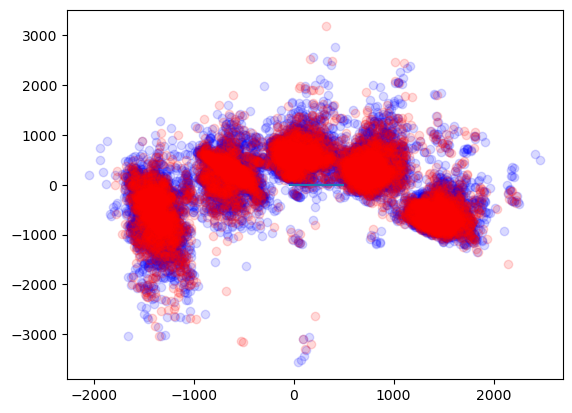

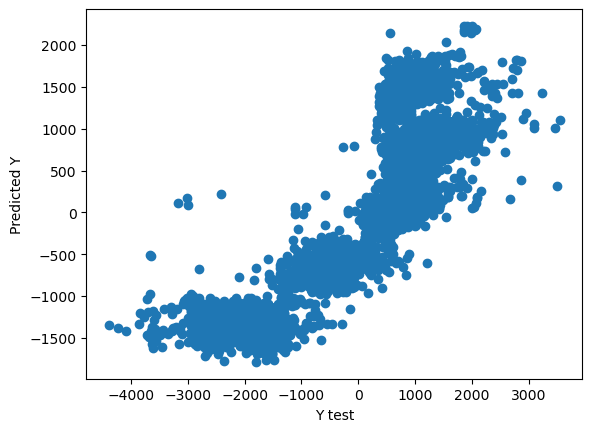

Test MAE:  524.8341
Test MSE:  399445.2990
Test RMSE:  632.0169
Test R2:  0.7210

Train MAE:  514.2352
Train MSE:  377369.9968
Train RMSE:  614.3045
Train R2:  0.7299



C:\Users\ygastfraind\anaconda3\Lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


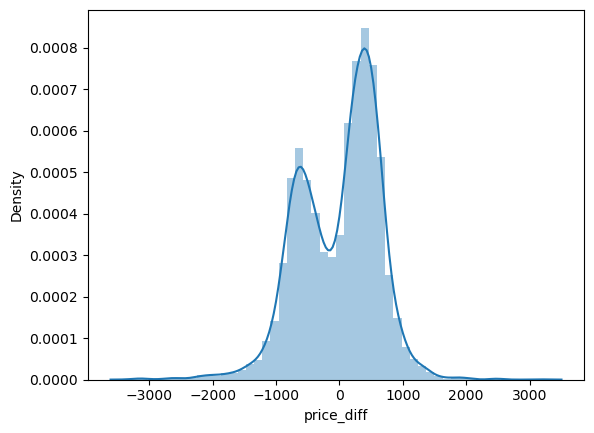

DataFrame: data_wo_features
--------------------------------

Intercept: 2281.2496529472887
                                                  Coeff
neighborhood_Upper East Side, New York_book     396.674
num_of_reviews_book                             338.464
neighborhood_Hudson Yards, New York_book        308.872
neighborhood_Tribeca, New York_book             208.647
neighborhood_East Village, New York_book        153.066
...                                                 ...
neighborhood_Washington Heights, New York_book -283.833
neighborhood_Flatiron District, New York_book  -362.422
neighborhood_Battery Park, New York_book       -385.997
neighborhood_Upper West Side_exp               -404.315
LOS_book                                       -712.114

[63 rows x 1 columns]


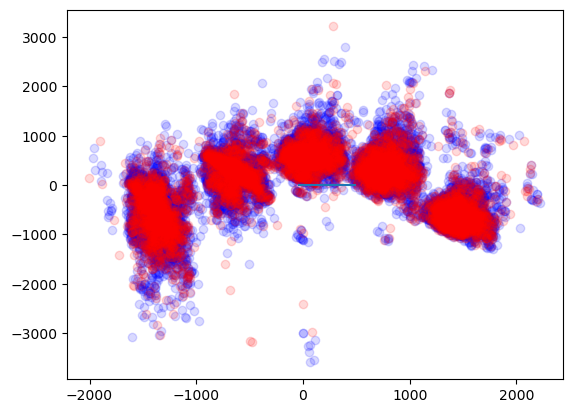

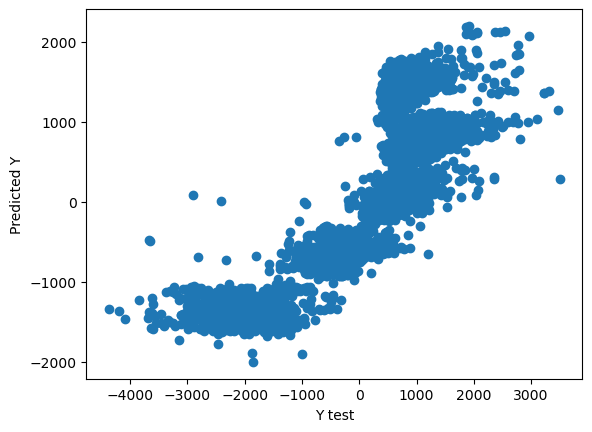

Test MAE:  516.1451
Test MSE:  382840.9536
Test RMSE:  618.7414
Test R2:  0.7265

Train MAE:  518.6290
Train MSE:  386946.5020
Train RMSE:  622.0502
Train R2:  0.7258



C:\Users\ygastfraind\anaconda3\Lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


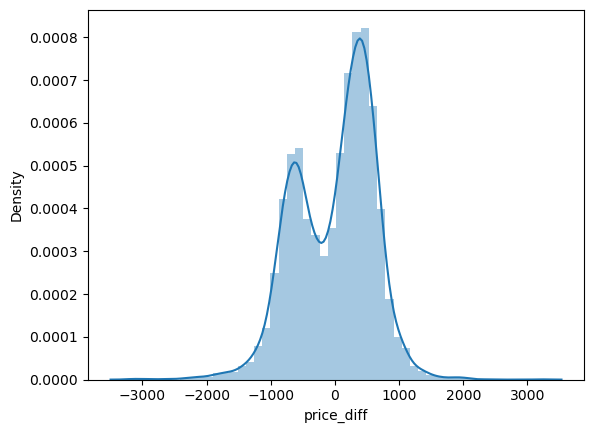

In [9]:
data_types = [data_min_max_scaled, data_wo_features]

for df in data_types:
    df_name = next(key for key, value in locals().items() if value is df)
    print(f"DataFrame: {df_name}")
    print("--------------------------------")
    print()
    
    X = df.drop('price_diff', axis=1)
    y = df['price_diff']
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3)
    
    lr = LinearRegression()
    lr.fit(X_train,y_train)

    print(f'Intercept: {lr.intercept_}')
    
    pd.options.display.float_format = '{:.3f}'.format
    # We will insert the data into the DF table
    cdf = pd.DataFrame(lr.coef_, X_train.columns, columns=['Coeff'])
    print(cdf.sort_values('Coeff', ascending=False))
        
    #### Predict the test set
    pred_test = lr.predict(X_test)
    pred_train = lr.predict(X_train)

    #### Print a scatterplot of the real y values of the test set against the predicted y values
    plt.scatter(pred_train, y_train-pred_train, c='b',alpha=0.15)
    plt.scatter(pred_test, y_test-pred_test, c='r',alpha=0.15)
    plt.hlines(y=0,xmin=-50,xmax=500)
    plt.show()

    plt.scatter(y_test, pred_test)
    plt.xlabel('Y test')
    plt.ylabel('Predicted Y')
    plt.show()

    #### Print evaluation metrics
    print('Test MAE: ', "%.4f" % mean_absolute_error(y_test, pred_test))
    print('Test MSE: ', "%.4f" % mean_squared_error(y_test, pred_test))
    print('Test RMSE: ', "%.4f" % np.sqrt(mean_squared_error(y_test, pred_test)))
    print('Test R2: ', "%.4f" % r2_score(y_test, pred_test))
    print()
    print('Train MAE: ', "%.4f" % mean_absolute_error(y_train,pred_train))
    print('Train MSE: ', "%.4f" % mean_squared_error(y_train,pred_train))
    print('Train RMSE: ', "%.4f" % np.sqrt(mean_squared_error(y_train,pred_train)))
    print('Train R2: ', "%.4f" % r2_score(y_train,pred_train))
    print()

    #### histogram 
    sns.distplot(y_test-pred_test)
    plt.show()


## Conclusion
In terms of additional features, similar results were obtained both with and without them.

* LOS – has a very strong negative effect on the price difference.

* num_of_reviews_book – has a positive effect on the price difference.

* neighborhood_Hudson Yards, New York_book and neighborhood_Upper East Side, New York_book – hotel affiliation with these neighborhoods has a positive effect on the price difference.

# Algorithm - Decision Tree Regressor

DataFrame: merged_data
--------------------------------

Max_depth: 2



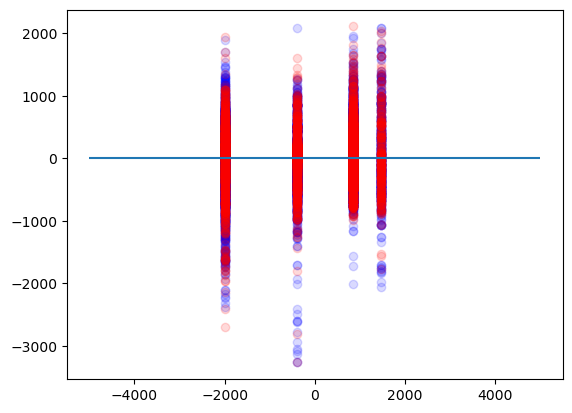

C:\Users\ygastfraind\anaconda3\Lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


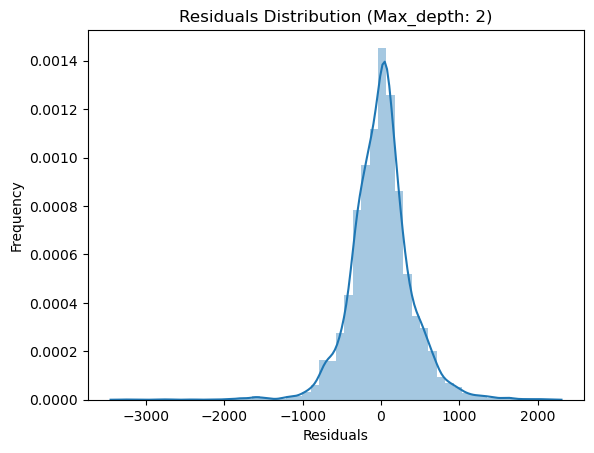

Max_depth: 3



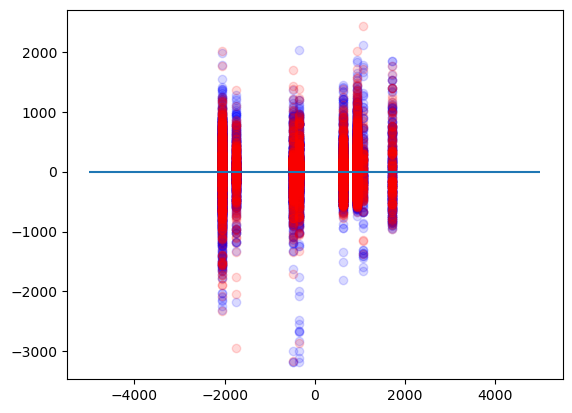

C:\Users\ygastfraind\anaconda3\Lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


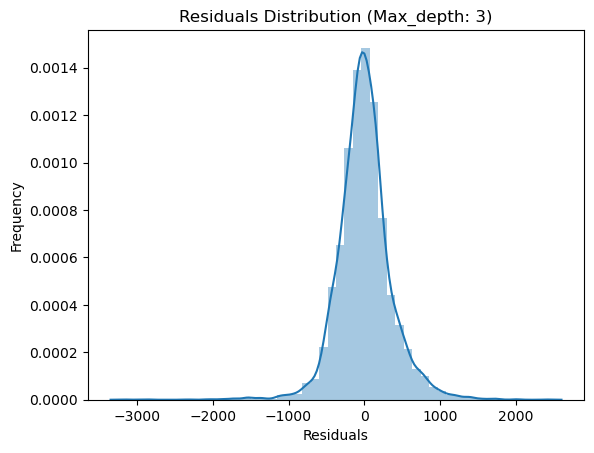

Max_depth: 5



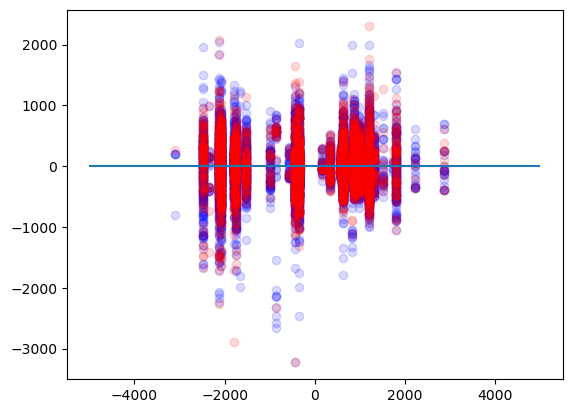

C:\Users\ygastfraind\anaconda3\Lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


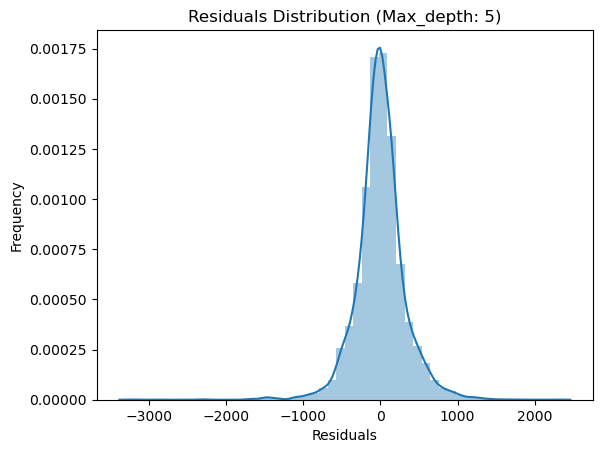

Max_depth: 8



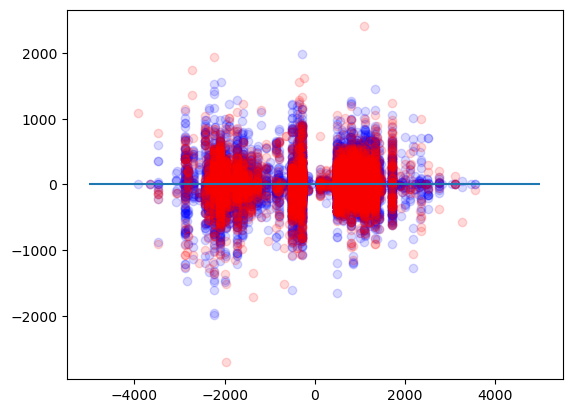

C:\Users\ygastfraind\anaconda3\Lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


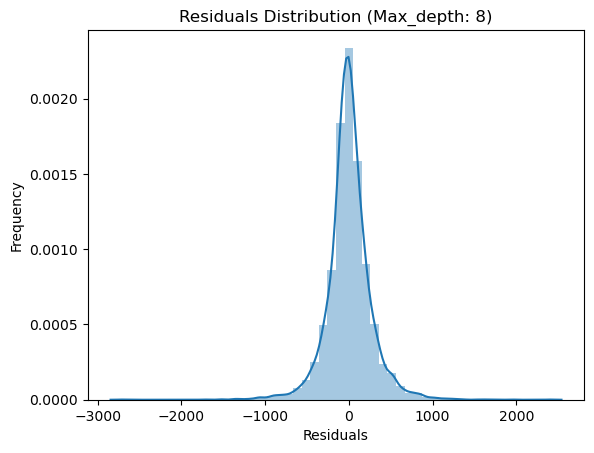

Max_depth: 10



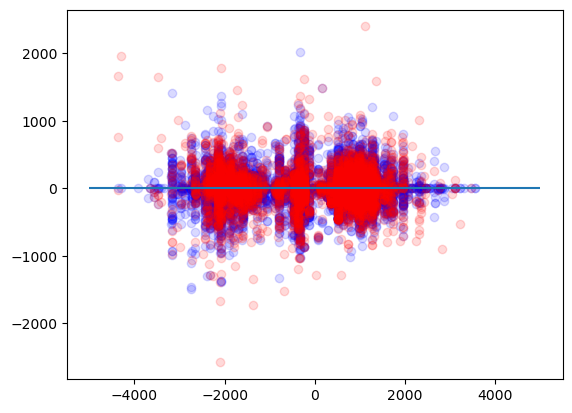

C:\Users\ygastfraind\anaconda3\Lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


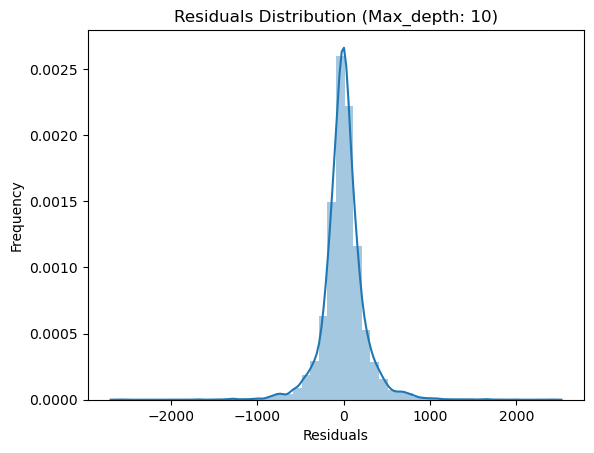

Test Set Results:
   Depth  Mean Squared Error  Root Mean Squared Error  Mean Absolute Error  \
0      2          149109.160                  386.147              277.189   
1      3          129656.091                  360.078              255.295   
2      5          103112.587                  321.111              223.064   
3      8           70157.114                  264.872              180.188   
4     10           58867.251                  242.626              158.974   

    R^2  
0 0.894  
1 0.907  
2 0.926  
3 0.950  
4 0.958  
Train Set Results:
   Depth  Mean Squared Error  Root Mean Squared Error  Mean Absolute Error  \
0      2          152167.861                  390.087              280.462   
1      3          132218.271                  363.618              255.955   
2      5          101862.101                  319.158              221.378   
3      8           60939.465                  246.859              169.570   
4     10           40599.750                

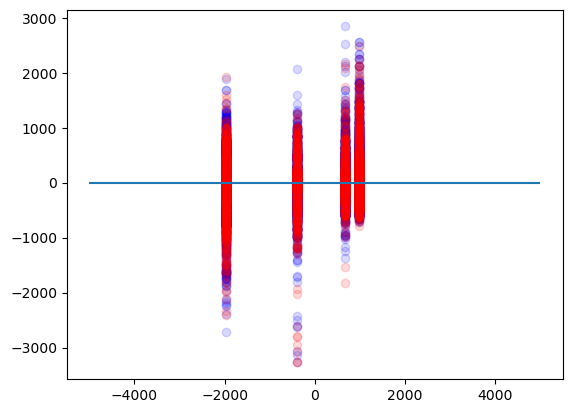

C:\Users\ygastfraind\anaconda3\Lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


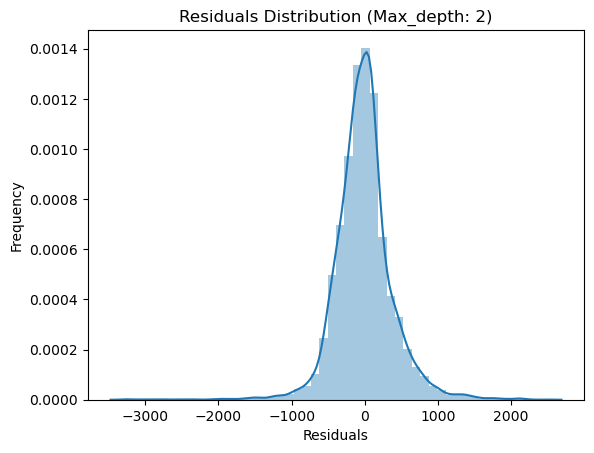

Max_depth: 3



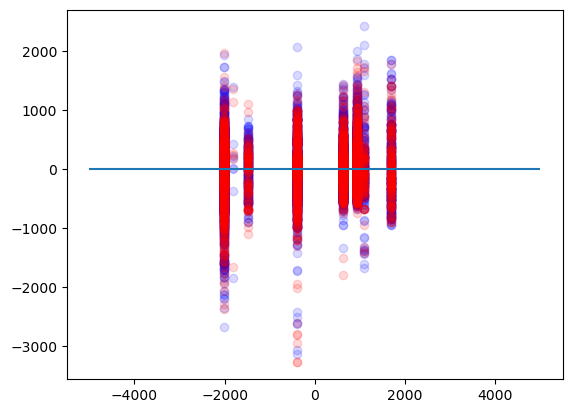

C:\Users\ygastfraind\anaconda3\Lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


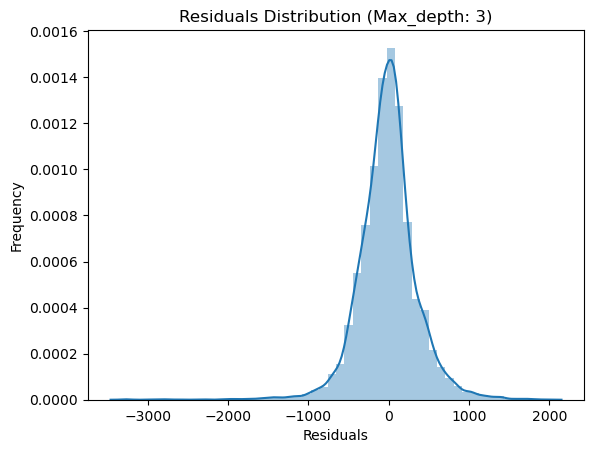

Max_depth: 5



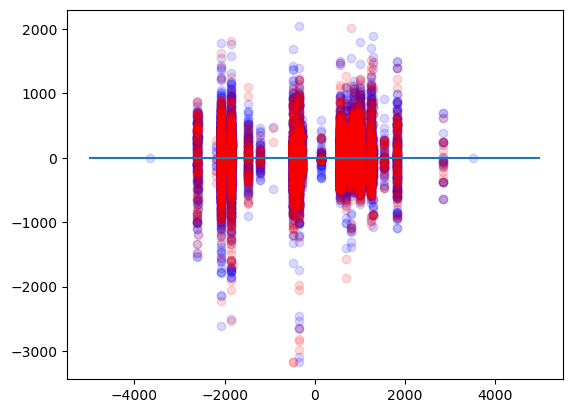

C:\Users\ygastfraind\anaconda3\Lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


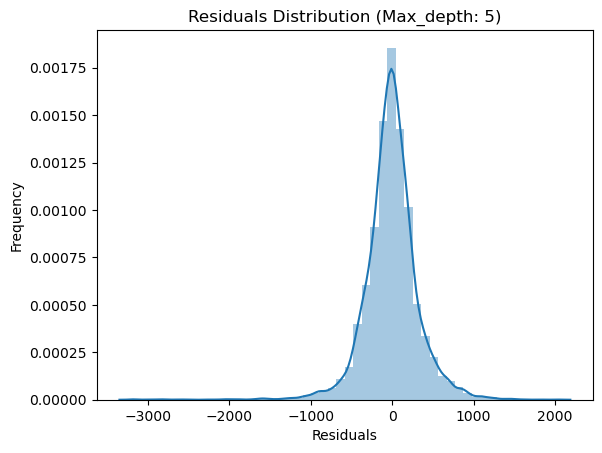

Max_depth: 8



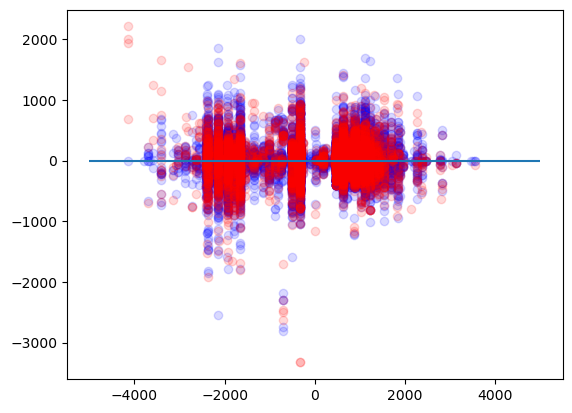

C:\Users\ygastfraind\anaconda3\Lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


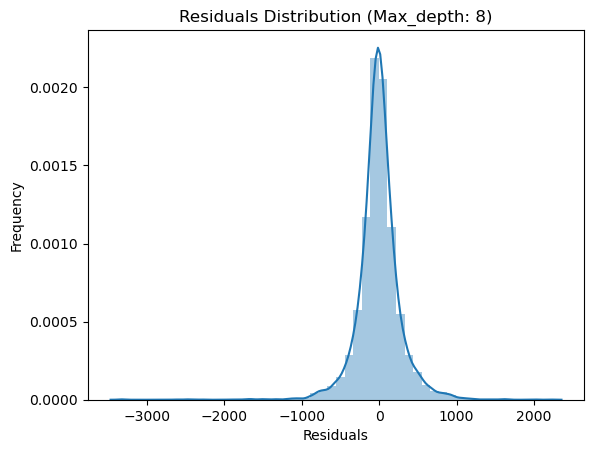

Max_depth: 10



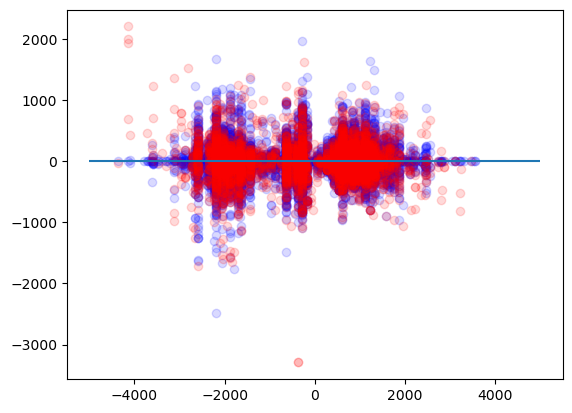

C:\Users\ygastfraind\anaconda3\Lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


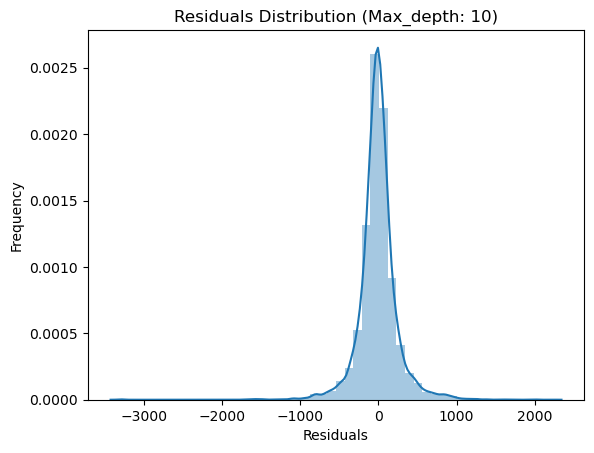

Test Set Results:
   Depth  Mean Squared Error  Root Mean Squared Error  Mean Absolute Error  \
0      2          159015.562                  398.768              277.030   
1      3          135912.249                  368.663              259.161   
2      5          109427.051                  330.798              226.605   
3      8           79485.392                  281.932              185.157   
4     10           63228.615                  251.453              160.737   

    R^2  
0 0.890  
1 0.906  
2 0.924  
3 0.945  
4 0.956  
Train Set Results:
   Depth  Mean Squared Error  Root Mean Squared Error  Mean Absolute Error  \
0      2          149481.674                  386.629              271.699   
1      3          129317.084                  359.607              255.808   
2      5          101380.251                  318.403              222.025   
3      8           65696.660                  256.314              173.799   
4     10           46279.813                

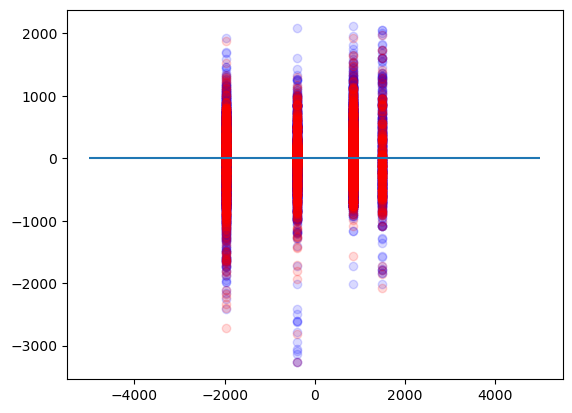

C:\Users\ygastfraind\anaconda3\Lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


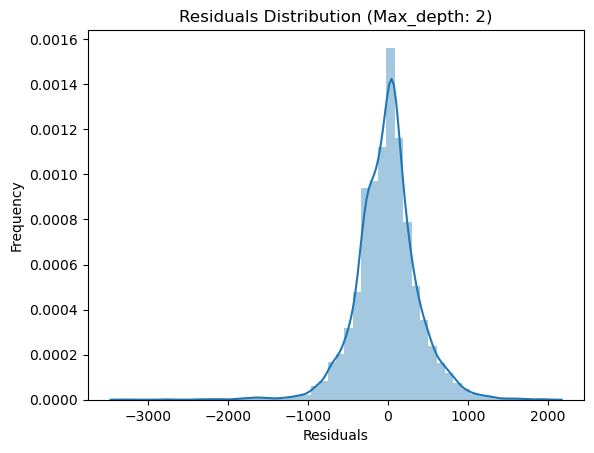

Max_depth: 3



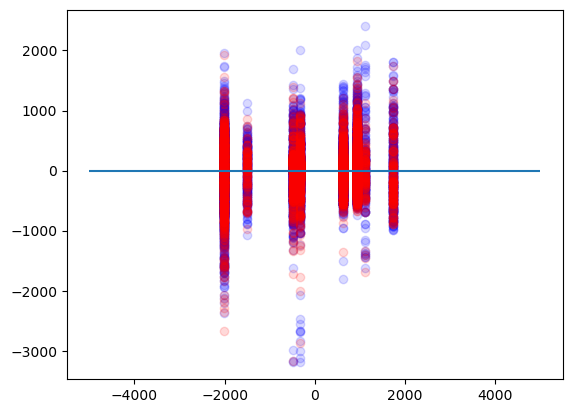

C:\Users\ygastfraind\anaconda3\Lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


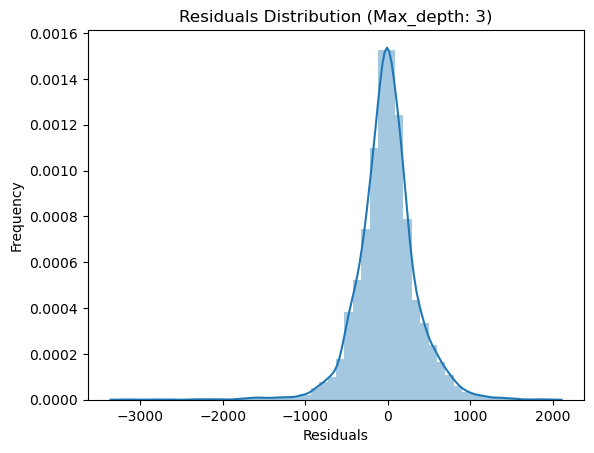

Max_depth: 5



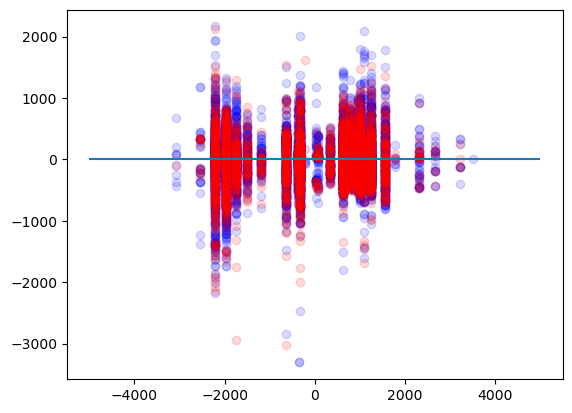

C:\Users\ygastfraind\anaconda3\Lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


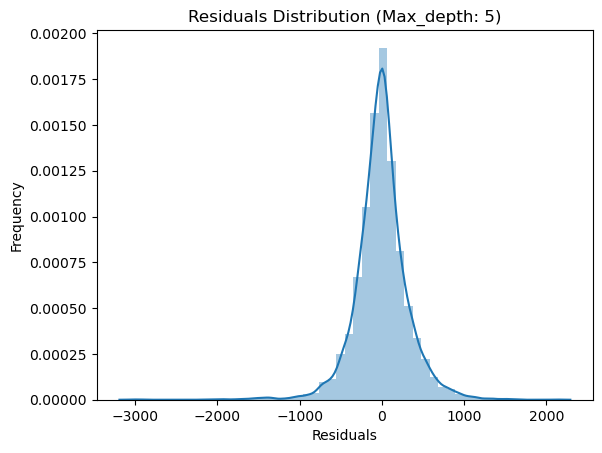

Max_depth: 8



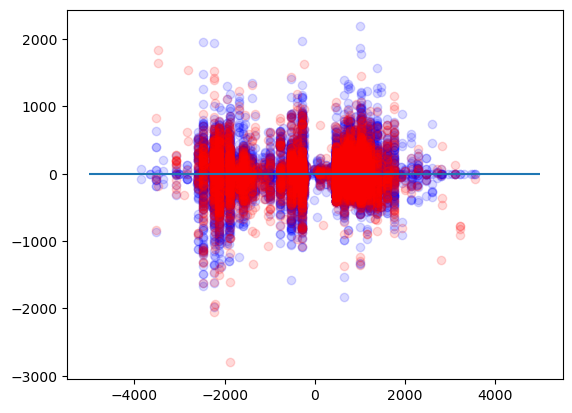

C:\Users\ygastfraind\anaconda3\Lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


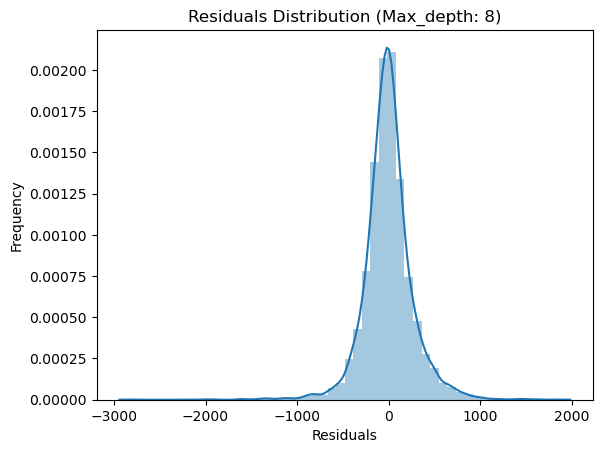

Max_depth: 10



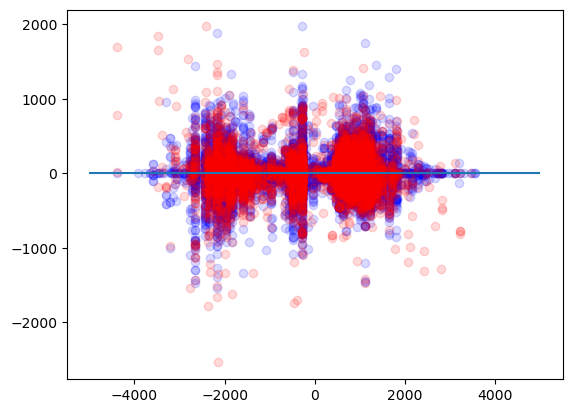

C:\Users\ygastfraind\anaconda3\Lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


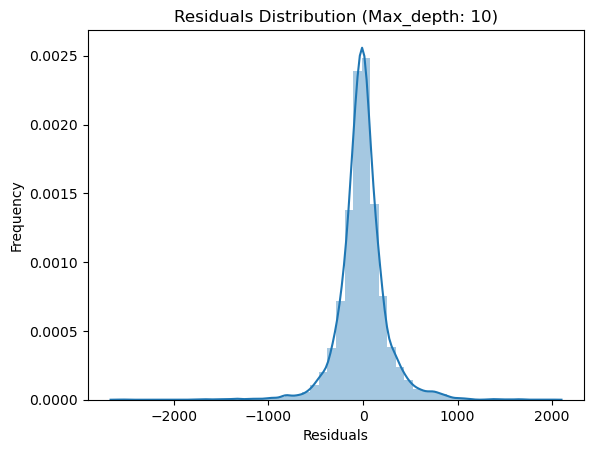

Test Set Results:
   Depth  Mean Squared Error  Root Mean Squared Error  Mean Absolute Error  \
0      2          149481.919                  386.629              277.286   
1      3          128416.547                  358.353              252.937   
2      5          104774.150                  323.688              224.287   
3      8           73930.690                  271.902              186.419   
4     10           63692.331                  252.373              165.441   

    R^2  
0 0.896  
1 0.910  
2 0.927  
3 0.948  
4 0.956  
Train Set Results:
   Depth  Mean Squared Error  Root Mean Squared Error  Mean Absolute Error  \
0      2          152029.086                  389.909              279.928   
1      3          132472.299                  363.967              258.200   
2      5          102701.938                  320.471              225.918   
3      8           67097.352                  259.032              181.188   
4     10           48412.731                

In [10]:
data_types = [merged_data,data_min_max_scaled, data_wo_features]
depth_values = [2, 3, 5, 8, 10]

for df in data_types:
    df_name = next(key for key, value in locals().items() if value is df)
    print(f"DataFrame: {df_name}")
    print("--------------------------------")
    print()
    
    X = df.drop('price_diff', axis=1)
    y = df['price_diff']
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3)
    results = {}
    
    for depth in depth_values:
        print(f"Max_depth: {depth}")
        print()
        DesTree = tree.DecisionTreeRegressor(max_depth=depth)
        DesTree.fit(X_train, y_train)
        
        #### Predict the test set
        pred_test = DesTree.predict(X_test)
        mse_test = mean_squared_error(y_test, pred_test)
        rmse_test = np.sqrt(mean_squared_error(y_test, pred_test))
        mae_test = mean_absolute_error(y_test, pred_test)
        r2_test = r2_score(y_test, pred_test)

        #### Predict the train set
        pred_train = DesTree.predict(X_train)
        mse_train = mean_squared_error(y_train,pred_train)
        rmse_train = np.sqrt(mean_squared_error(y_train,pred_train))
        mae_train = mean_absolute_error(y_train,pred_train)
        r2_train = r2_score(y_train,pred_train)
        
        #### Print a scatterplot of the real y values of the test set against the predicted y values
        plt.scatter(pred_train, y_train-pred_train, c='b',alpha=0.15)
        plt.scatter(pred_test, y_test-pred_test, c='r',alpha=0.15)
        plt.hlines(y=0,xmin=-5000,xmax=5000)
        plt.show()

        #### histogram 
        sns.distplot(y_test-pred_test)
        plt.title(f"Residuals Distribution (Max_depth: {depth})")
        plt.xlabel('Residuals')
        plt.ylabel('Frequency')
        plt.show()

        results[depth] = {
            'test': {'mse': mse_test, 'rmse': rmse_test, 'mae': mae_test, 'r2': r2_test, 'y_pred': pred_test},
            'train': {'mse': mse_train, 'rmse': rmse_train, 'mae': mae_train, 'r2': r2_train, 'y_pred': pred_train}
        }
        

    results_df_test = pd.DataFrame([(depth, res['test']['mse'], res['test']['rmse'], res['test']['mae'], res['test']['r2']) for depth, res in results.items()],
                              columns=['Depth', 'Mean Squared Error', 'Root Mean Squared Error', 'Mean Absolute Error', 'R^2'])
    
    results_df_train = pd.DataFrame([(depth, res['train']['mse'], res['train']['rmse'], res['train']['mae'], res['train']['r2']) for depth, res in results.items()],
                              columns=['Depth', 'Mean Squared Error', 'Root Mean Squared Error', 'Mean Absolute Error', 'R^2'])
    
    print("Test Set Results:")
    print(results_df_test)
    
    print("Train Set Results:")
    print(results_df_train)
    print()


## Conclusion
Even when the tree depth = 2, better results are obtained than those of linear regression, and the greater the tree depth, the better the results and the better the model.

We ran it several times, we will also try to perform a different distribution and increase the test at the expense of the train and examine the effect

## Split the data to training set and test set

DataFrame: merged_data
--------------------------------

Test_size: 0.2



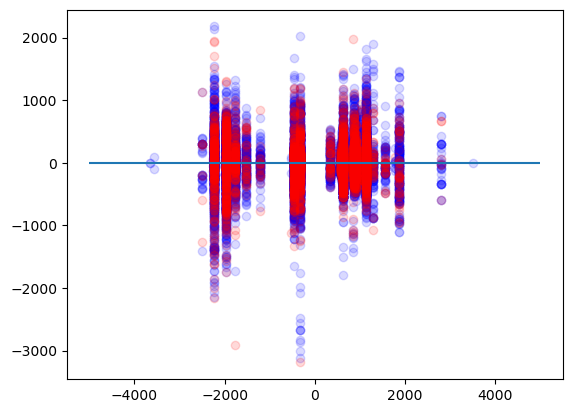

C:\Users\ygastfraind\anaconda3\Lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


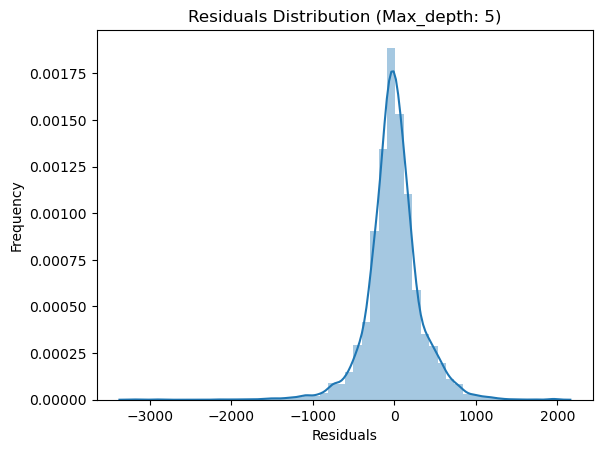

Test_size: 0.4



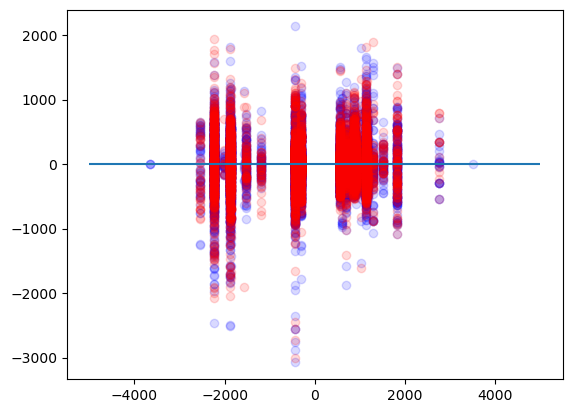

C:\Users\ygastfraind\anaconda3\Lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


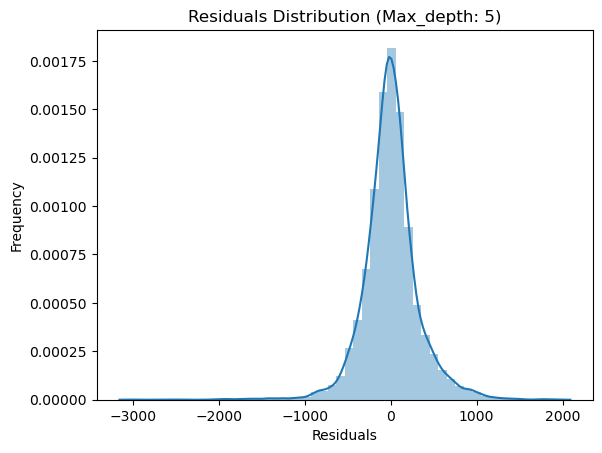

Test_size: 0.5



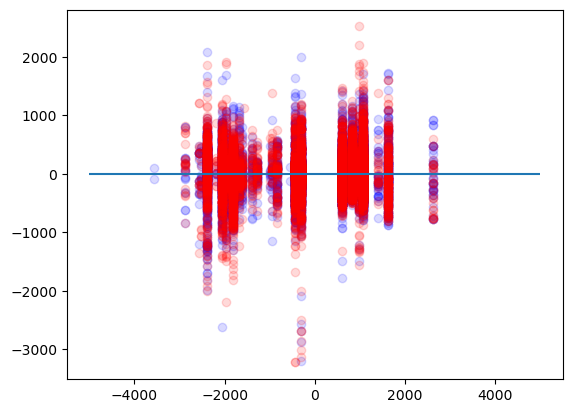

C:\Users\ygastfraind\anaconda3\Lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


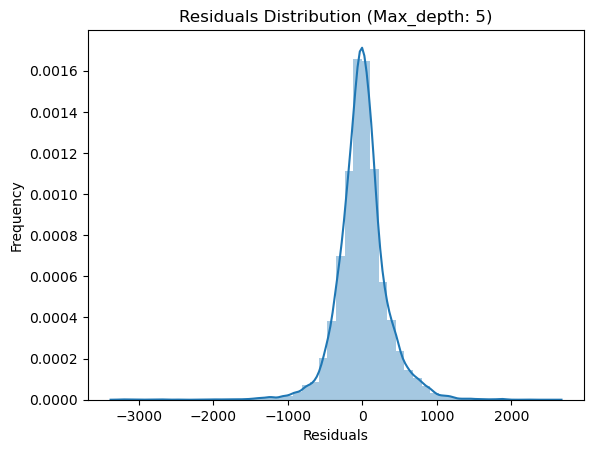

Test Set Results:
   Size  Mean Squared Error  Root Mean Squared Error  Mean Absolute Error  \
0 0.200          109205.147                  330.462              226.703   
1 0.400          106988.466                  327.091              225.646   
2 0.500          113561.237                  336.988              233.232   

    R^2  
0 0.922  
1 0.924  
2 0.919  

Train Set Results:
   Size  Mean Squared Error  Root Mean Squared Error  Mean Absolute Error  \
0 0.200          104097.416                  322.641              223.623   
1 0.400          103755.647                  322.111              223.836   
2 0.500          101696.519                  318.899              226.265   

    R^2  
0 0.926  
1 0.926  
2 0.928  

DataFrame: data_min_max_scaled
--------------------------------

Test_size: 0.2



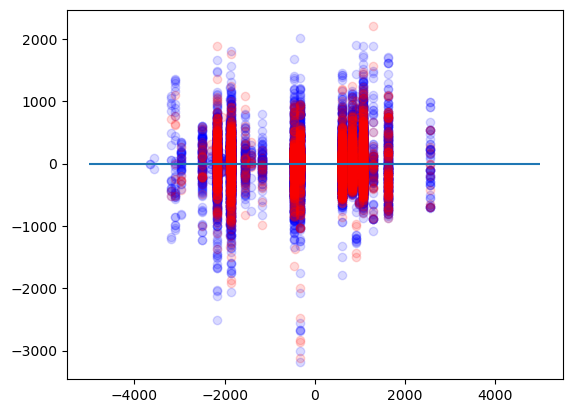

C:\Users\ygastfraind\anaconda3\Lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


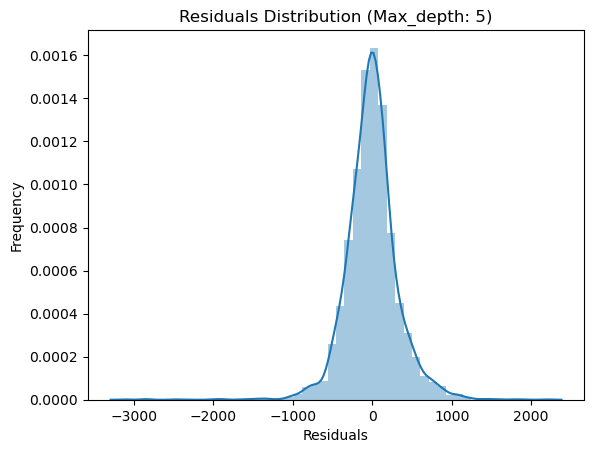

Test_size: 0.4



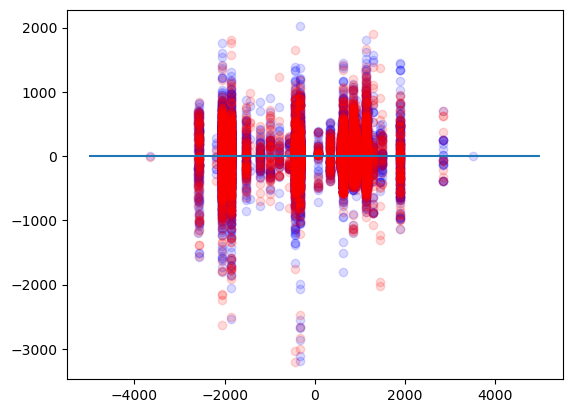

C:\Users\ygastfraind\anaconda3\Lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


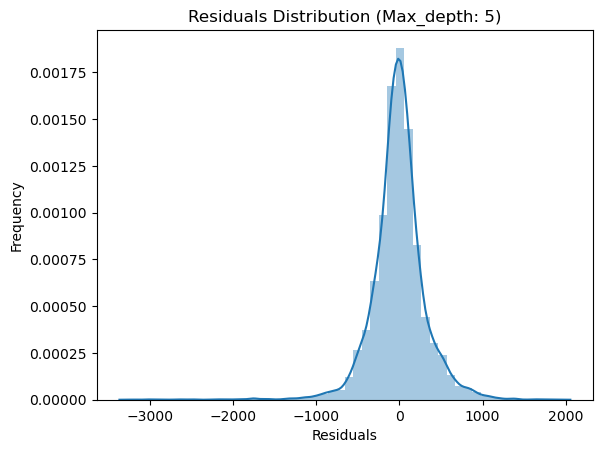

Test_size: 0.5



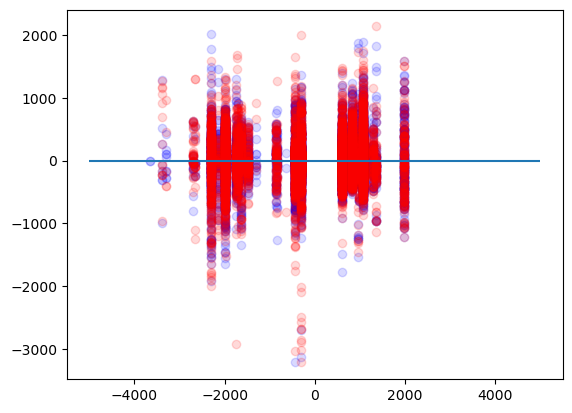

C:\Users\ygastfraind\anaconda3\Lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


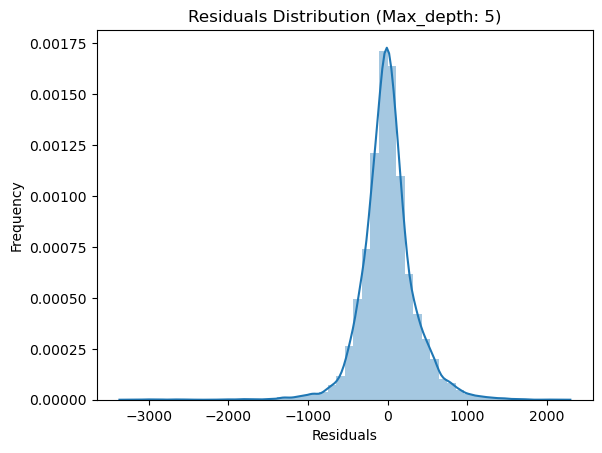

Test Set Results:
   Size  Mean Squared Error  Root Mean Squared Error  Mean Absolute Error  \
0 0.200          108395.133                  329.234              232.408   
1 0.400          105345.940                  324.570              221.217   
2 0.500          113623.134                  337.080              233.399   

    R^2  
0 0.920  
1 0.927  
2 0.920  

Train Set Results:
   Size  Mean Squared Error  Root Mean Squared Error  Mean Absolute Error  \
0 0.200          106945.811                  327.026              230.856   
1 0.400          100926.791                  317.690              219.994   
2 0.500          100208.361                  316.557              223.788   

    R^2  
0 0.925  
1 0.927  
2 0.928  

DataFrame: data_wo_features
--------------------------------

Test_size: 0.2



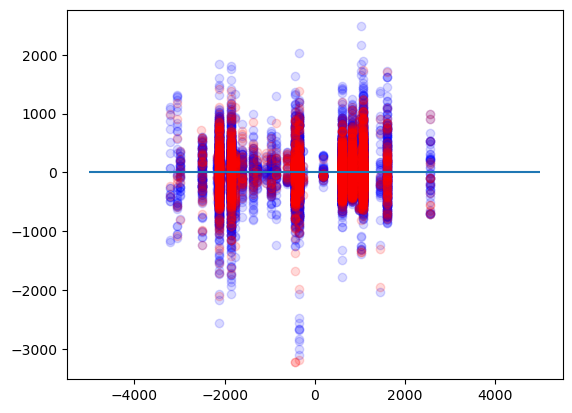

C:\Users\ygastfraind\anaconda3\Lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


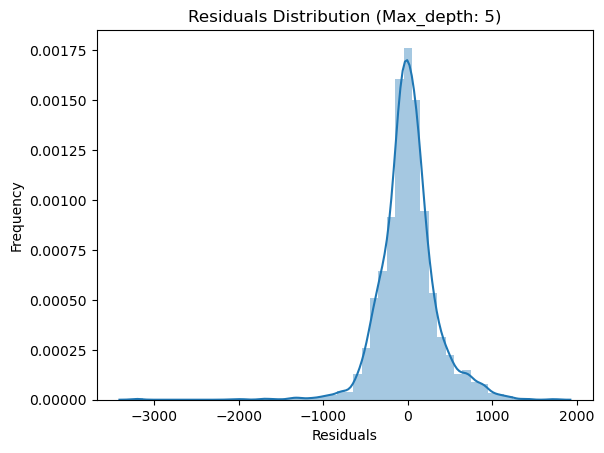

Test_size: 0.4



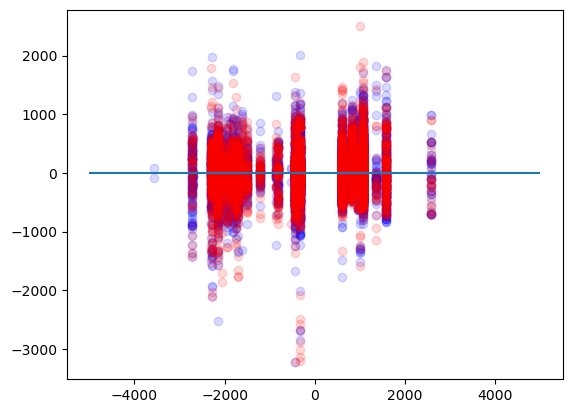

C:\Users\ygastfraind\anaconda3\Lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


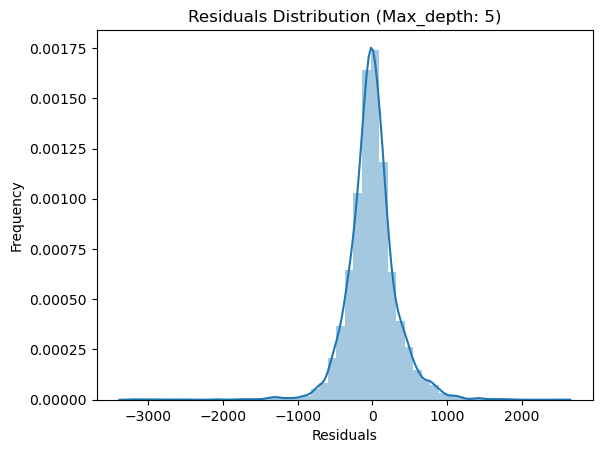

Test_size: 0.5



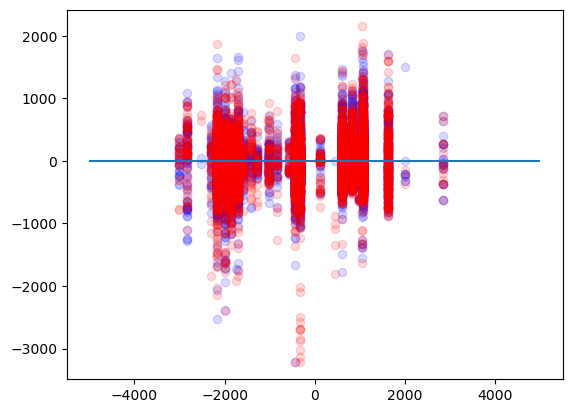

C:\Users\ygastfraind\anaconda3\Lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


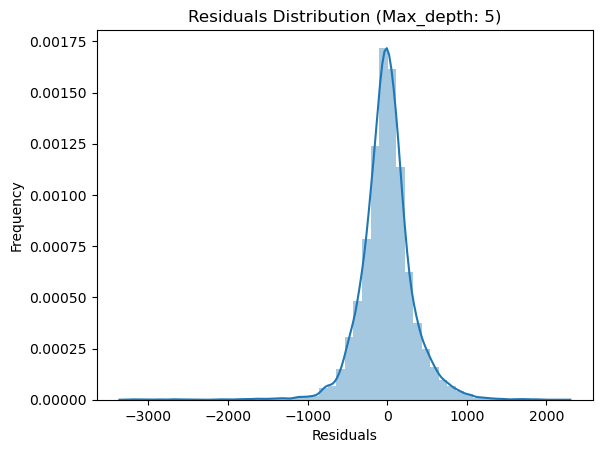

Test Set Results:
   Size  Mean Squared Error  Root Mean Squared Error  Mean Absolute Error  \
0 0.200          110339.379                  332.174              229.538   
1 0.400          109305.785                  330.614              228.065   
2 0.500          110217.990                  331.991              229.028   

    R^2  
0 0.921  
1 0.923  
2 0.922  

Train Set Results:
   Size  Mean Squared Error  Root Mean Squared Error  Mean Absolute Error  \
0 0.200          104666.966                  323.523              226.381   
1 0.400          100032.068                  316.278              224.095   
2 0.500          103010.113                  320.952              228.487   

    R^2  
0 0.926  
1 0.929  
2 0.927  



In [21]:
data_types = [merged_data, data_min_max_scaled, data_wo_features]
test_size_values = [0.2, 0.4, 0.5]

for df in data_types:
    df_name = next(key for key, value in locals().items() if value is df)
    print(f"DataFrame: {df_name}")
    print("--------------------------------")
    print()
    
    X = df.drop('price_diff', axis=1)
    y = df['price_diff']
    results = {}
    
    for size in test_size_values:
        print(f"Test_size: {size}")
        print()
        
        X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=size)
        DesTree = tree.DecisionTreeRegressor(max_depth=5)
        DesTree.fit(X_train, y_train)
        
        #### Predict the test set
        pred_test = DesTree.predict(X_test)
        mse_test = mean_squared_error(y_test, pred_test)
        rmse_test = np.sqrt(mean_squared_error(y_test, pred_test))
        mae_test = mean_absolute_error(y_test, pred_test)
        r2_test = r2_score(y_test, pred_test)

        #### Predict the train set
        pred_train = DesTree.predict(X_train)
        mse_train = mean_squared_error(y_train,pred_train)
        rmse_train = np.sqrt(mean_squared_error(y_train,pred_train))
        mae_train = mean_absolute_error(y_train,pred_train)
        r2_train = r2_score(y_train,pred_train)
        
        #### Print a scatterplot of the real y values of the test set against the predicted y values
        plt.scatter(pred_train, y_train-pred_train, c='b',alpha=0.15)
        plt.scatter(pred_test, y_test-pred_test, c='r',alpha=0.15)
        plt.hlines(y=0,xmin=-5000,xmax=5000)
        plt.show()

        #### Print a histogram the residuals
        sns.distplot(y_test-pred_test)
        plt.title(f"Residuals Distribution (Max_depth: {5})")
        plt.xlabel('Residuals')
        plt.ylabel('Frequency')
        plt.show()

        results[size] = {
            'test': {'mse': mse_test, 'rmse': rmse_test, 'mae': mae_test, 'r2': r2_test, 'y_pred': pred_test},
            'train': {'mse': mse_train, 'rmse': rmse_train, 'mae': mae_train, 'r2': r2_train, 'y_pred': pred_train}
        }
        

    # Convert results to a DataFrame for better visualization
    results_df_test = pd.DataFrame([(size, res['test']['mse'], res['test']['rmse'], res['test']['mae'], res['test']['r2']) for size, res in results.items()],
                              columns=['Size', 'Mean Squared Error', 'Root Mean Squared Error', 'Mean Absolute Error', 'R^2'])
    
    results_df_train = pd.DataFrame([(size, res['train']['mse'], res['train']['rmse'], res['train']['mae'], res['train']['r2']) for size, res in results.items()],
                              columns=['Size', 'Mean Squared Error', 'Root Mean Squared Error', 'Mean Absolute Error', 'R^2'])
    
    # Display the results for test set
    print("Test Set Results:")
    print(results_df_test)
    print()
    
    # Display the results for train set
    print("Train Set Results:")
    print(results_df_train)
    print()
    
        

## Conclusion
Relatively similar results were obtained in the different distributions

Let's try to test RandomForestRegressor

## Use RandomForestRegressor

Test MAE:  217.2765
Test MSE:  98354.7802
Test RMSE:  313.6157
Test R2:  0.9289

Train MAE:  215.4066
Train MSE:  95185.9844
Train RMSE:  308.5223
Train R2:  0.9329


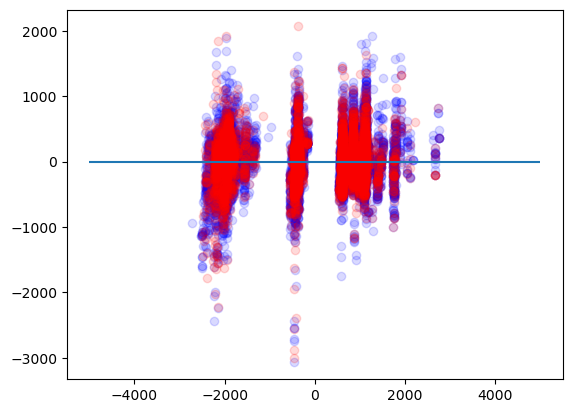

C:\Users\ygastfraind\anaconda3\Lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


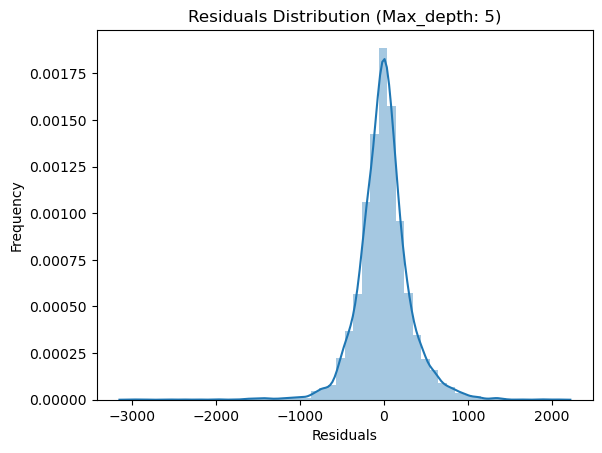

In [12]:
X = data_min_max_scaled.drop('price_diff', axis=1)
y = data_min_max_scaled['price_diff']

# split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3)

Random_Forest = RandomForestRegressor(n_estimators=200, max_depth=5)
Random_Forest.fit(X_train, y_train)
pred_train = Random_Forest.predict(X_train)
pred_test = Random_Forest.predict(X_test)

print('Test MAE: ', "%.4f" % mean_absolute_error(y_test, pred_test))
print('Test MSE: ', "%.4f" % mean_squared_error(y_test, pred_test))
print('Test RMSE: ', "%.4f" % np.sqrt(mean_squared_error(y_test, pred_test)))
print('Test R2: ', "%.4f" % r2_score(y_test, pred_test))
print()
print('Train MAE: ', "%.4f" % mean_absolute_error(y_train,pred_train))
print('Train MSE: ', "%.4f" % mean_squared_error(y_train,pred_train))
print('Train RMSE: ', "%.4f" % np.sqrt(mean_squared_error(y_train,pred_train)))
print('Train R2: ', "%.4f" % r2_score(y_train,pred_train))

# Print scatter plot
plt.scatter(pred_train, y_train-pred_train, c='b',alpha=0.15)
plt.scatter(pred_test, y_test-pred_test, c='r',alpha=0.15)
plt.hlines(y=0,xmin=-5000,xmax=5000)
plt.show()
print()

#### Print a histogram the residuals
sns.distplot(y_test-pred_test)
plt.title(f"Residuals Distribution (Max_depth: {5})")
plt.xlabel('Residuals')
plt.ylabel('Frequency')
plt.show()
print()


## Use feature importance

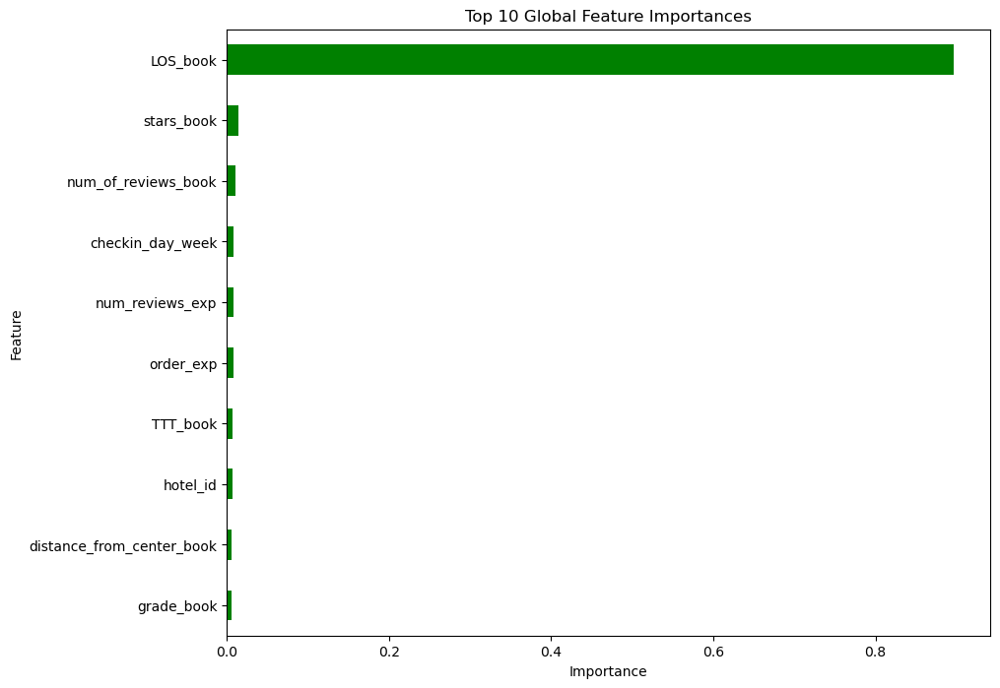

In [13]:
Random_Forest = RandomForestRegressor(n_estimators=200)
Random_Forest.fit(X_train, y_train)

data = data_min_max_scaled.drop('price_diff', axis=1)
feature_names = data.columns[0:]

# Convert feature importances to a pandas Series
global_importances = pd.Series(Random_Forest.feature_importances_, index=feature_names)

# Sort the importances Series and select the top 10 features
global_importances_sorted = global_importances.nlargest(10)

# Reverse the Series to have the highest importance at the top for plotting
global_importances_sorted = global_importances_sorted.iloc[::-1]

# Plot the sorted top 10 feature importances
plt.figure(figsize=(10, 8))
global_importances_sorted.plot(kind='barh', color='green')
plt.xlabel("Importance")
plt.ylabel("Feature")
plt.title("Top 10 Global Feature Importances")
plt.show()

## Conclusion
It can be seen that the LOS feature has the strongest influence on the price difference

Followed by (significantly weaker) the number of stars

## Use feature importance בקופסא שחורה

                      feature  importance
9                    LOS_book       1.920
5                  stars_book       0.024
2         num_of_reviews_book       0.018
64           checkin_day_week       0.015
39            num_reviews_exp       0.014
45                  order_exp       0.013
0                  grade_book       0.011
12          bed_category_book       0.010
8                    TTT_book       0.009
4   distance_from_center_book       0.009


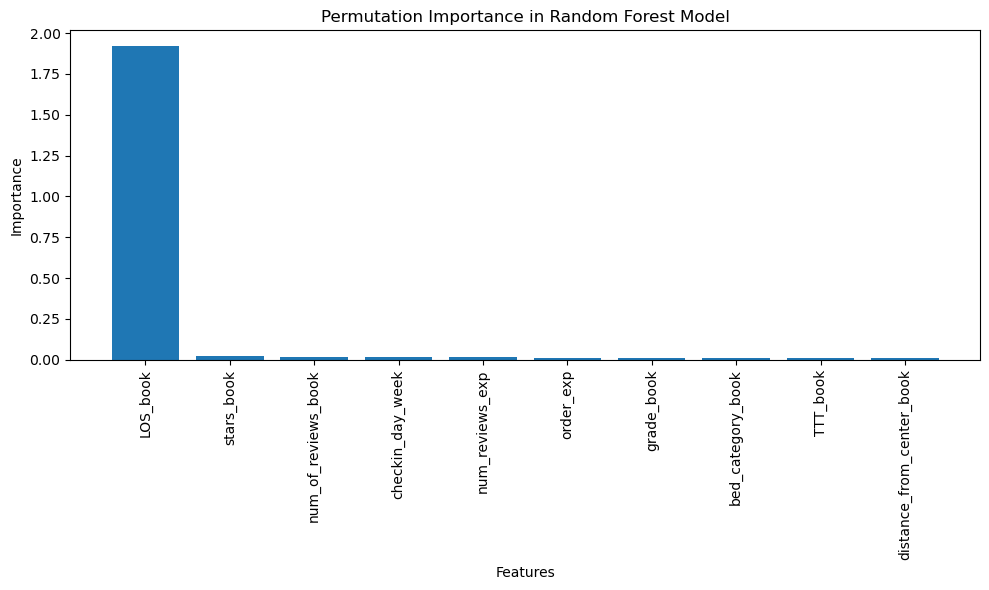

In [14]:
from sklearn.inspection import permutation_importance

# Calculating the importance of features using Permutation Importance
perm_importance = permutation_importance(Random_Forest, X_test, y_test, n_repeats=5)

# Create a DataFrame for feature importance
feature_importance_df = pd.DataFrame({
    'feature': X.columns,
    'importance': perm_importance.importances_mean
}).sort_values(by='importance', ascending=False)[:10]

print(feature_importance_df)

plt.figure(figsize=(10, 6))
plt.bar(feature_importance_df['feature'], feature_importance_df['importance'])
plt.xticks(rotation=90)
plt.xlabel('Features')
plt.ylabel('Importance')
plt.title('Permutation Importance in Random Forest Model')
plt.tight_layout()
plt.show()

# Algorithm - KNN

DataFrame: merged_data
--------------------------------

Test Set Results:
     K  Mean Squared Error  Root Mean Squared Error  Mean Absolute Error   R^2
0    1          317641.493                  563.597              279.393 0.773
1    3          282267.764                  531.289              333.146 0.799
2    5          302194.287                  549.722              355.765 0.784
3   10          356390.787                  596.985              397.457 0.746
4   15          402388.847                  634.341              431.065 0.713
5   20          445463.788                  667.431              459.891 0.682
6   80          728609.174                  853.586              630.383 0.480
7  200          925878.302                  962.226              741.439 0.339

Train Set Results:
     K  Mean Squared Error  Root Mean Squared Error  Mean Absolute Error   R^2
0    1               0.000                    0.000                0.000 1.000
1    3          130007.773          

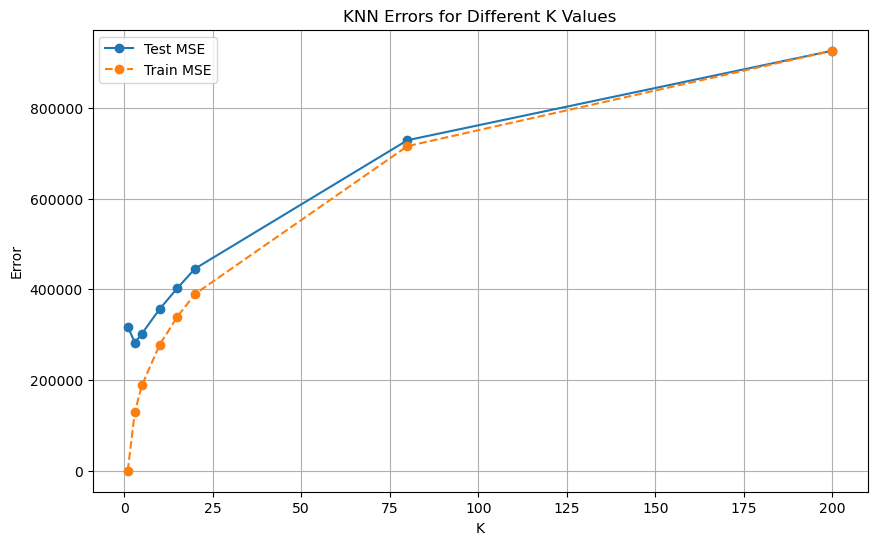

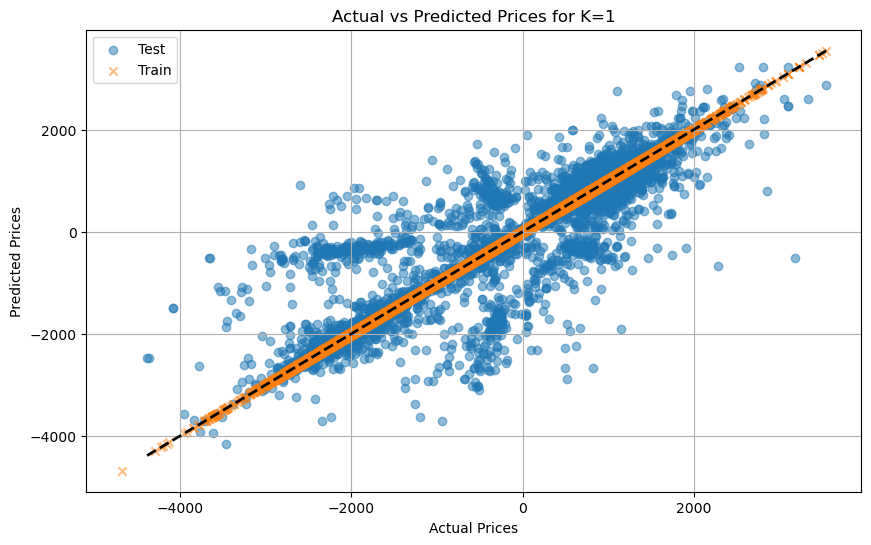

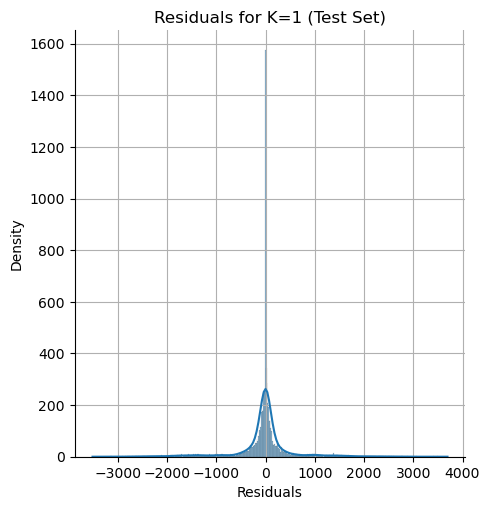

C:\Users\ygastfraind\anaconda3\Lib\site-packages\seaborn\distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)


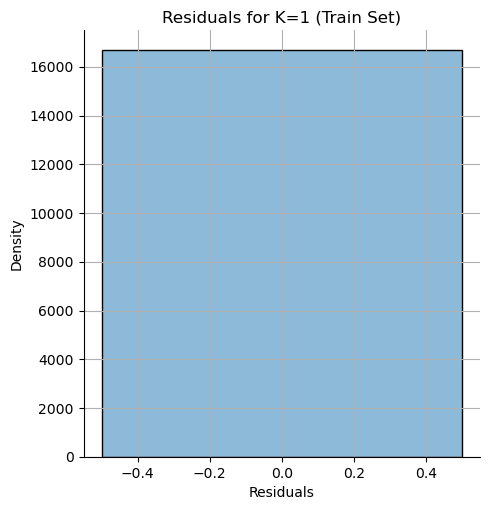

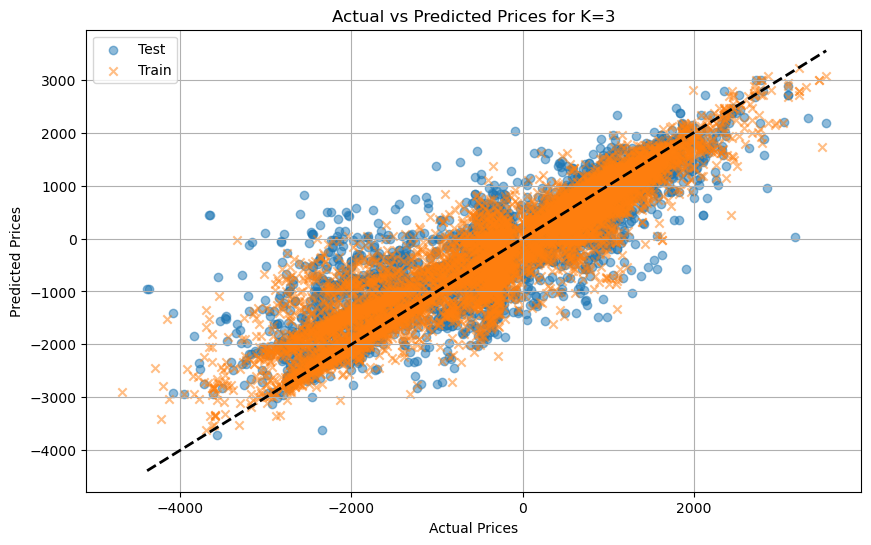

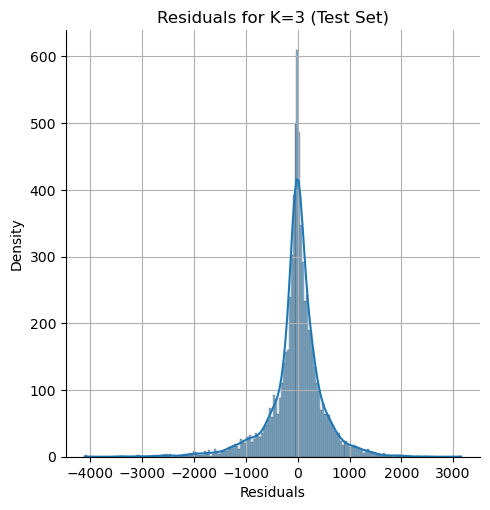

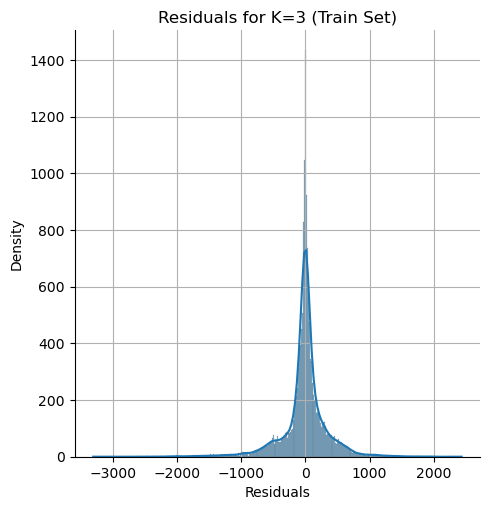

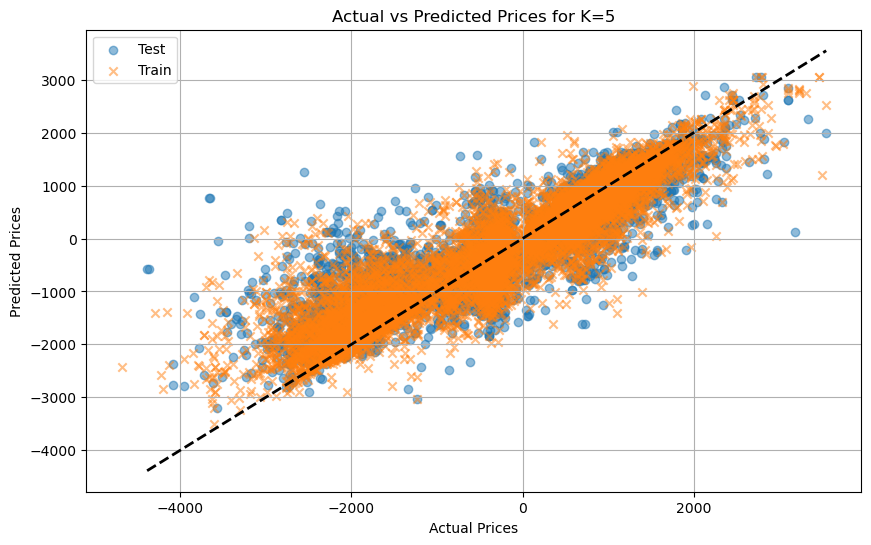

...

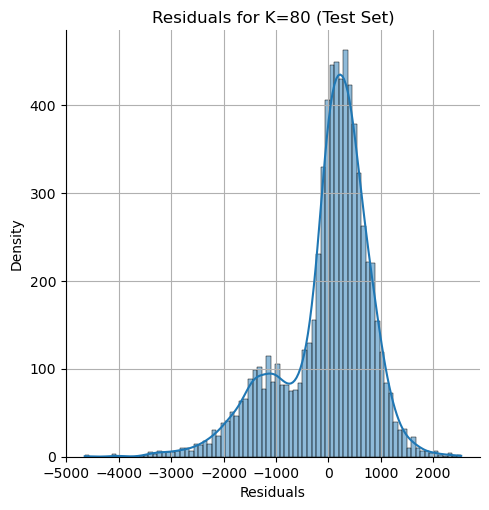

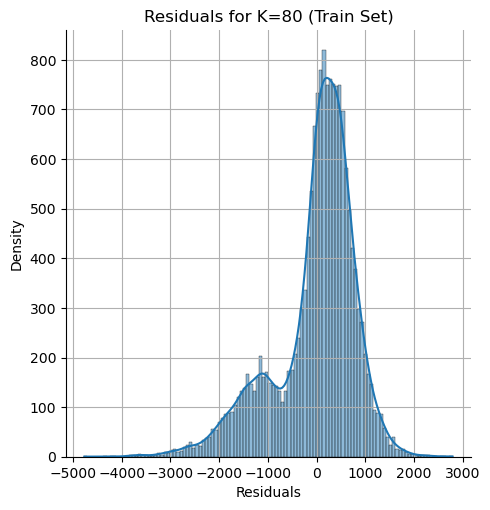

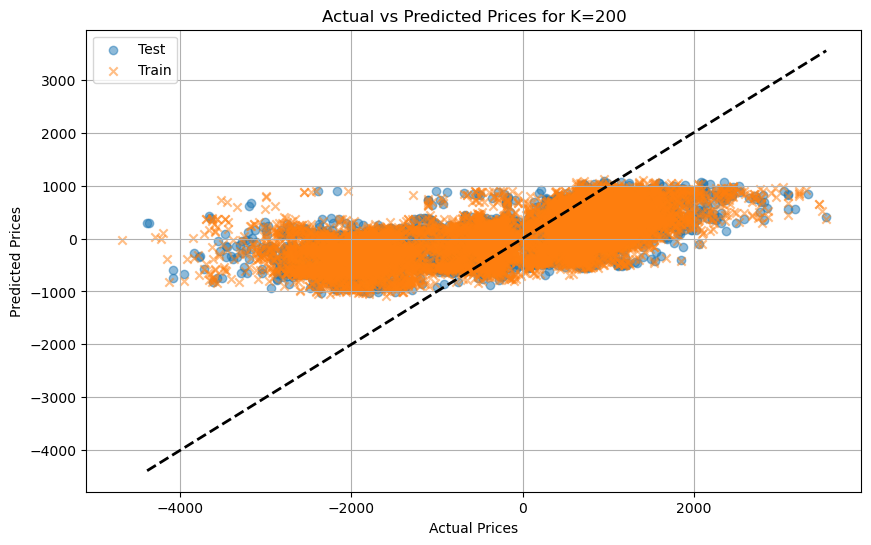

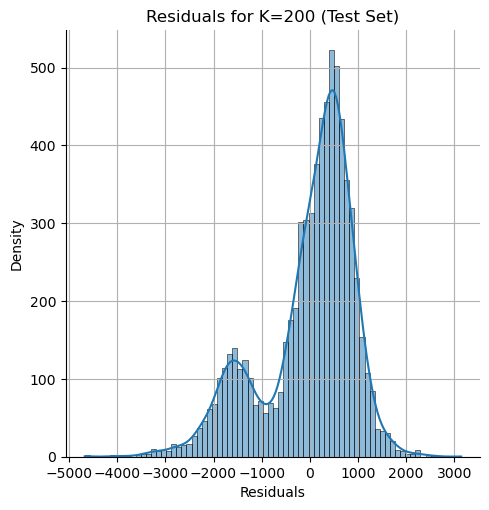

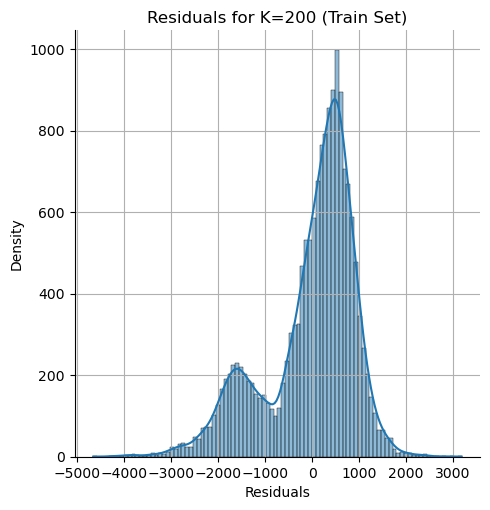

DataFrame: data_wo_features
--------------------------------

Test Set Results:
     K  Mean Squared Error  Root Mean Squared Error  Mean Absolute Error   R^2
0    1          200902.148                  448.221              214.552 0.856
1    3          199291.450                  446.421              254.598 0.857
2    5          223207.060                  472.448              285.750 0.840
3   10          271227.496                  520.795              330.913 0.805
4   15          319433.625                  565.185              368.990 0.770
5   20          356459.617                  597.042              399.578 0.744
6   80          672040.552                  819.781              599.124 0.517
7  200          895220.712                  946.161              726.972 0.356

Train Set Results:
     K  Mean Squared Error  Root Mean Squared Error  Mean Absolute Error   R^2
0    1               0.000                    0.000                0.000 1.000
1    3           82545.264     

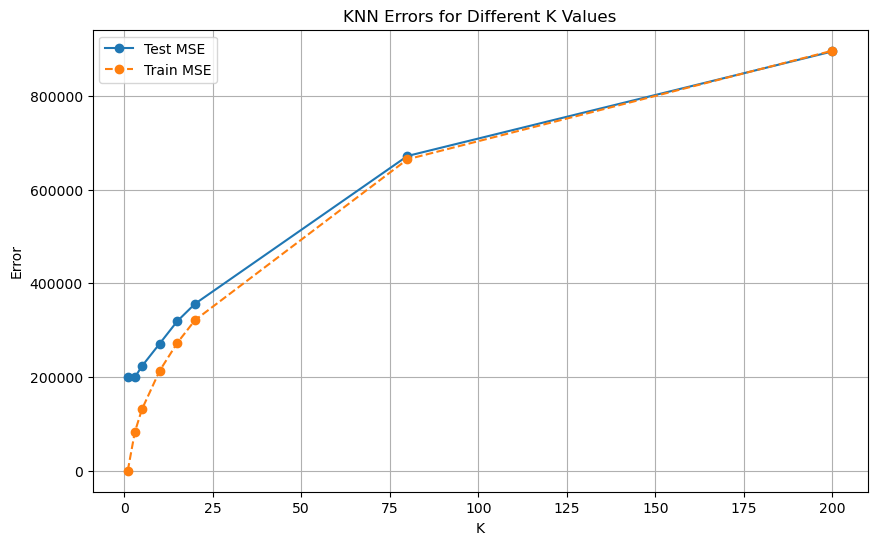

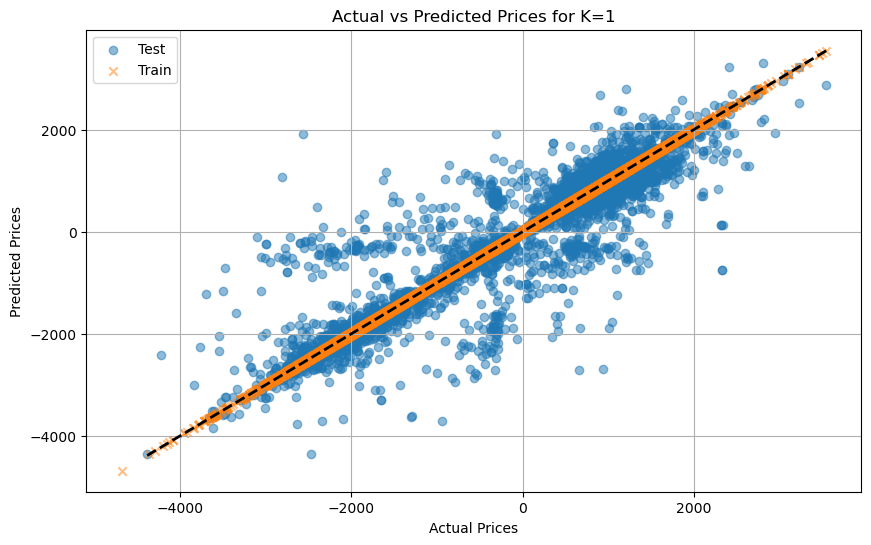

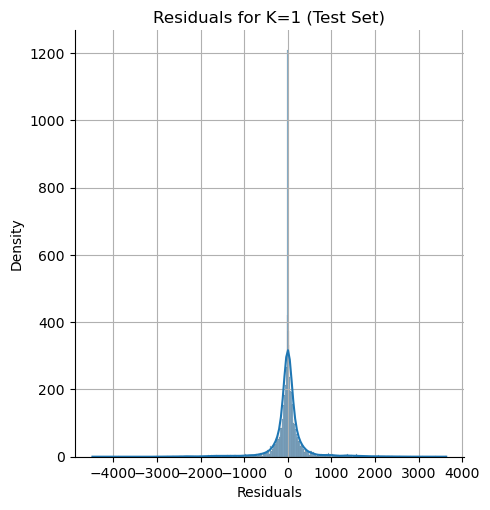

C:\Users\ygastfraind\anaconda3\Lib\site-packages\seaborn\distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)


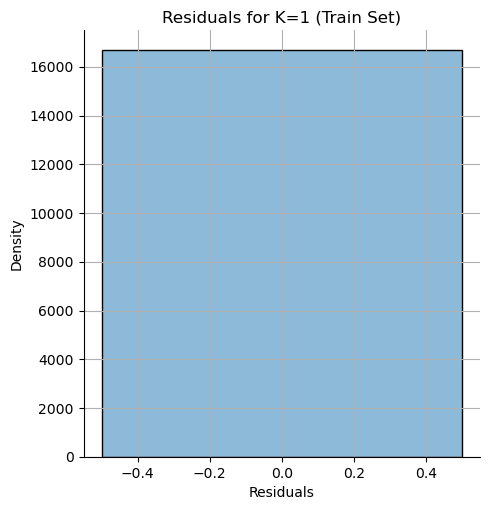

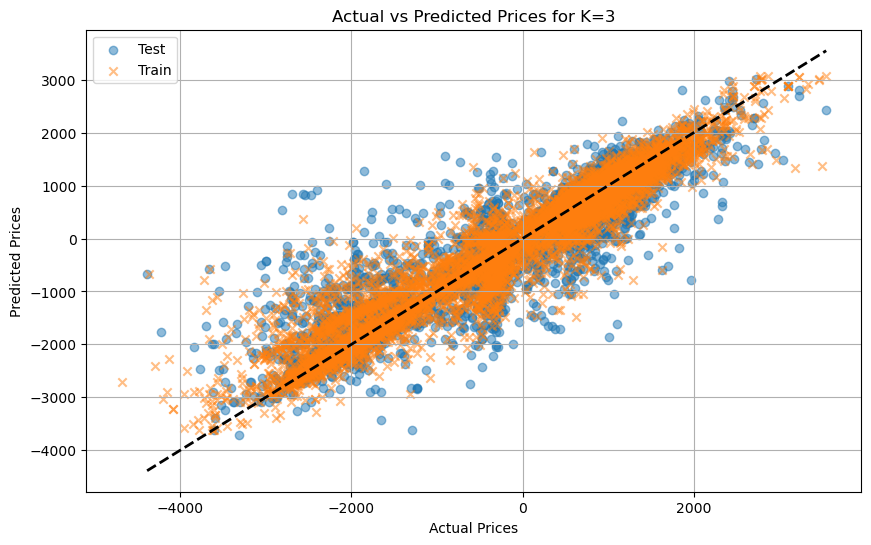

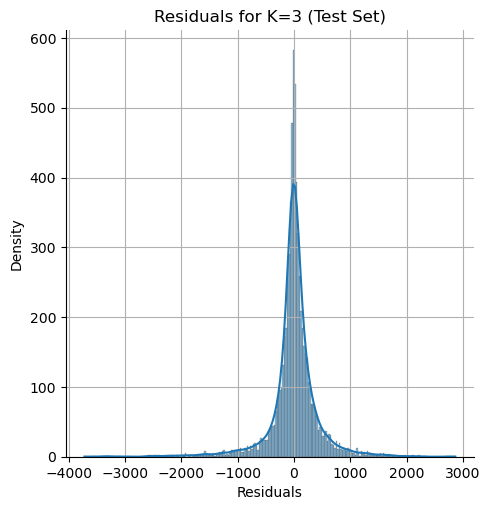

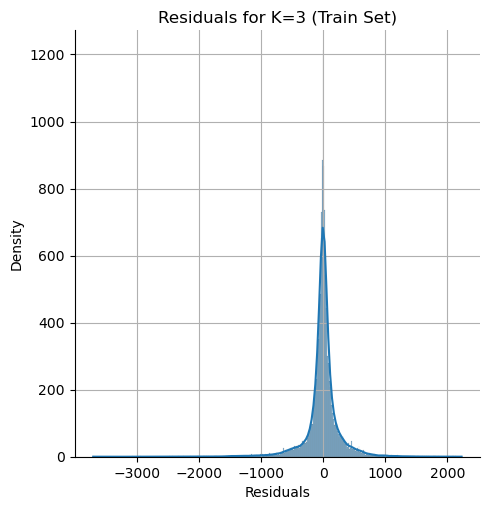

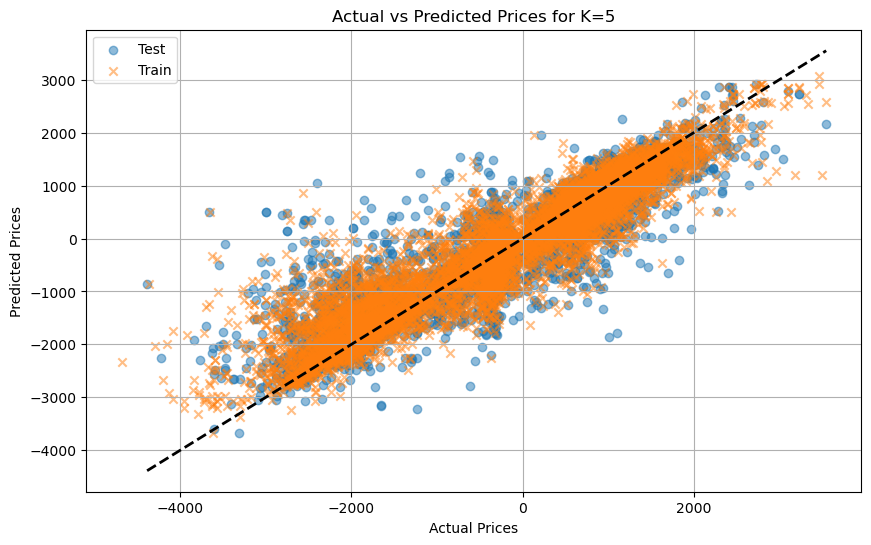

...

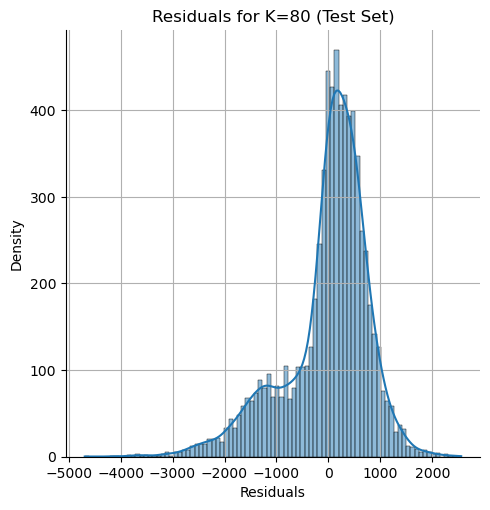

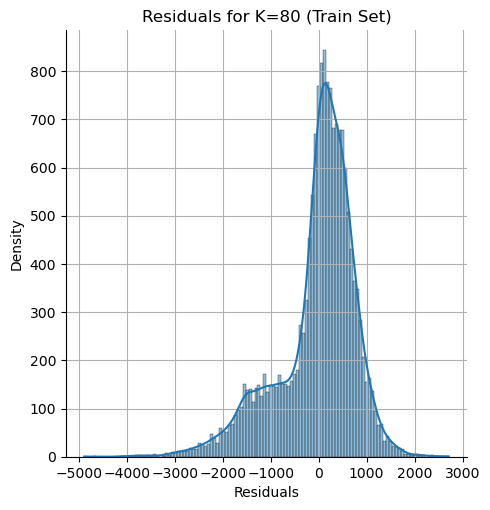

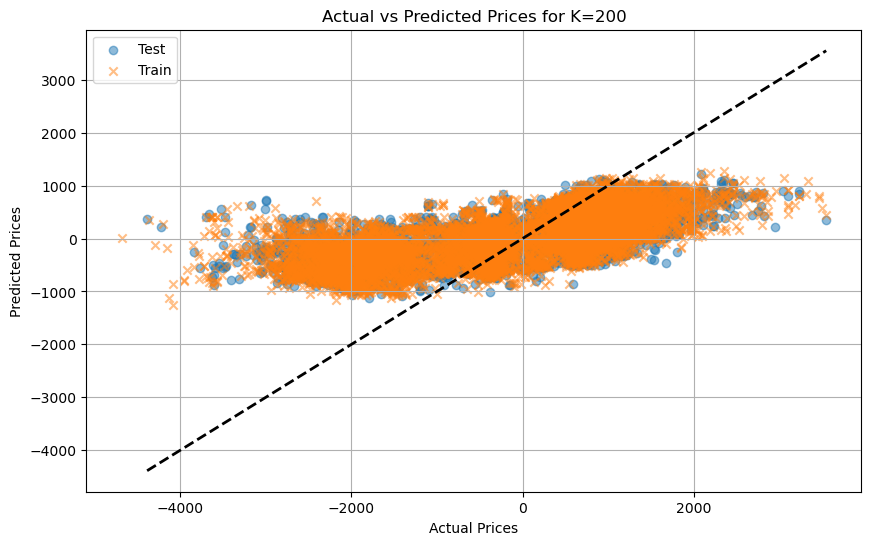

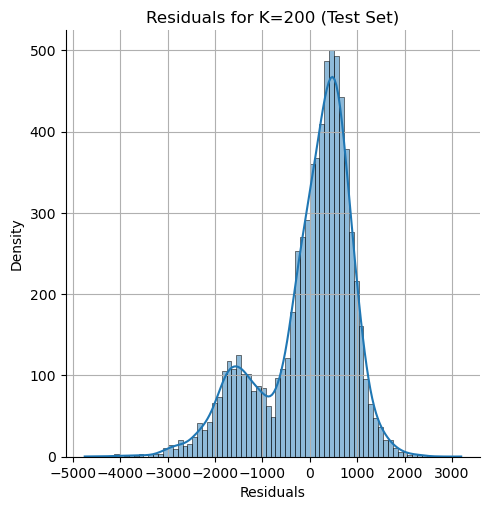

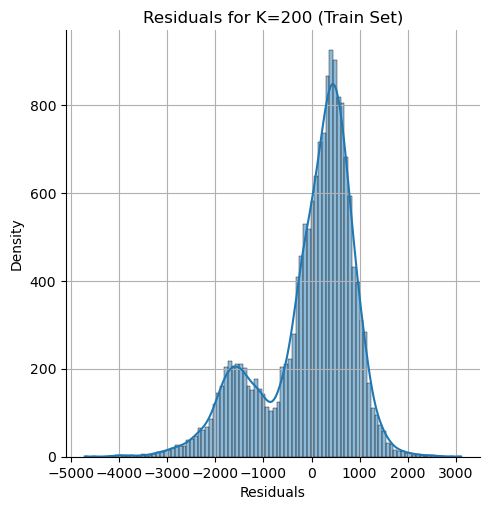

In [15]:
data_types = [merged_data, data_wo_features]

for df in data_types:
    df_name = next(key for key, value in locals().items() if value is df)
    print(f"DataFrame: {df_name}")
    print("--------------------------------")
    print()
    
    X = df.drop('price_diff', axis=1)
    y = df['price_diff']
    
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3)

    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    def evaluate_knn(k_values, X_train, y_train, X_test, y_test):
        results = {}
        for k in k_values:
            knn = KNeighborsRegressor(n_neighbors=k)
            knn.fit(X_train, y_train)
        
            # Evaluate on test set
            y_pred_test = knn.predict(X_test)
            mse_test = mean_squared_error(y_test, y_pred_test)
            rmse_test = np.sqrt(mse_test)
            mae_test = mean_absolute_error(y_test, y_pred_test)
            r2_test = r2_score(y_test, y_pred_test)
        
            # Evaluate on train set
            y_pred_train = knn.predict(X_train)
            mse_train = mean_squared_error(y_train, y_pred_train)
            rmse_train = np.sqrt(mse_train)
            mae_train = mean_absolute_error(y_train, y_pred_train)
            r2_train = r2_score(y_train, y_pred_train)
        
            results[k] = {
                'test': {'mse': mse_test, 'rmse': rmse_test, 'mae': mae_test, 'r2': r2_test, 'y_pred': y_pred_test},
                'train': {'mse': mse_train, 'rmse': rmse_train, 'mae': mae_train, 'r2': r2_train, 'y_pred': y_pred_train}
            }
        return results

    k_values = [1, 3, 5, 10, 15, 20, 80, 200]

    results = evaluate_knn(k_values, X_train_scaled, y_train, X_test_scaled, y_test)

    results_df_test = pd.DataFrame([(k, res['test']['mse'], res['test']['rmse'], res['test']['mae'], res['test']['r2']) for k, res in results.items()],
                              columns=['K', 'Mean Squared Error', 'Root Mean Squared Error', 'Mean Absolute Error', 'R^2'])

    results_df_train = pd.DataFrame([(k, res['train']['mse'], res['train']['rmse'], res['train']['mae'], res['train']['r2']) for k, res in results.items()],
                              columns=['K', 'Mean Squared Error', 'Root Mean Squared Error', 'Mean Absolute Error', 'R^2'])

    print("Test Set Results:")
    print(results_df_test)
    print()

    print("Train Set Results:")
    print(results_df_train)
    print()

    # Plot the Mean Squared Error for different values of K for test set
    plt.figure(figsize=(10, 6))
    plt.plot(results_df_test['K'], results_df_test['Mean Squared Error'], marker='o', label='Test MSE')
    plt.plot(results_df_train['K'], results_df_train['Mean Squared Error'], marker='o', label='Train MSE', linestyle='--')
    plt.title('KNN Errors for Different K Values')
    plt.xlabel('K')
    plt.ylabel('Error')
    plt.legend()
    plt.grid(True)
    plt.show()

    # Plot scatter plots of actual vs predicted values for each K for both train and test sets
    for k in k_values:
        plt.figure(figsize=(10, 6))
        plt.scatter(y_test, results[k]['test']['y_pred'], alpha=0.5, label='Test')
        plt.scatter(y_train, results[k]['train']['y_pred'], alpha=0.5, label='Train', marker='x')
        plt.title(f'Actual vs Predicted Prices for K={k}')
        plt.xlabel('Actual Prices')
        plt.ylabel('Predicted Prices')
        plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
        plt.legend()
        plt.grid(True)
        plt.show()

        # Plot residuals for test set
        residuals_test = y_test - results[k]['test']['y_pred']
        sns.displot(residuals_test, kde=True)
        plt.title(f'Residuals for K={k} (Test Set)')
        plt.xlabel('Residuals')
        plt.ylabel('Density')
        plt.grid(True)
        plt.show()
        
        # Plot residuals for train set
        residuals_train = y_train - results[k]['train']['y_pred']
        sns.displot(residuals_train, kde=True)
        plt.title(f'Residuals for K={k} (Train Set)')
        plt.xlabel('Residuals')
        plt.ylabel('Density')
        plt.grid(True)
        plt.show()


## Conclusion
It can be seen that the results obtained are less good than those obtained with the RandomForestRegressor model.

# Algorithm - AdaBoostRegressor

DataFrame: merged_data
--------------------------------



C:\Users\ygastfraind\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\ygastfraind\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\ygastfraind\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\ygastfraind\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\ygastfraind\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Us

Test Set Results:
   n_estimators  Mean Squared Error  Root Mean Squared Error  \
0             1          143719.604                  379.104   
1             2          143719.604                  379.104   
2             3          131108.661                  362.089   
3             5          129035.601                  359.215   
4            10          129720.924                  360.168   
5           100          150552.316                  388.011   
6           200          150552.316                  388.011   

   Mean Absolute Error   R^2  
0              269.511 0.898  
1              269.511 0.898  
2              259.943 0.907  
3              257.968 0.908  
4              265.845 0.908  
5              300.285 0.893  
6              300.285 0.893  

Train Set Results:
   n_estimators  Mean Squared Error  Root Mean Squared Error  \
0             1          143979.028                  379.446   
1             2          143979.028                  379.446   
2        

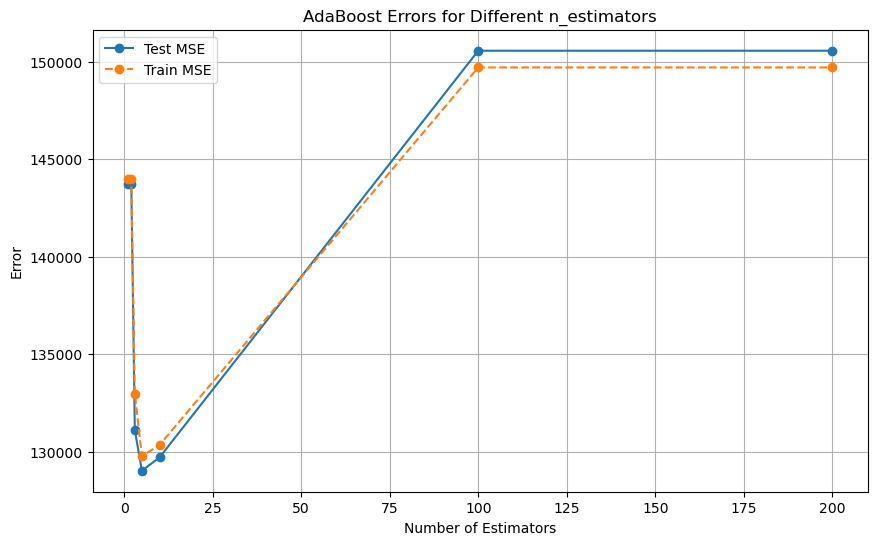

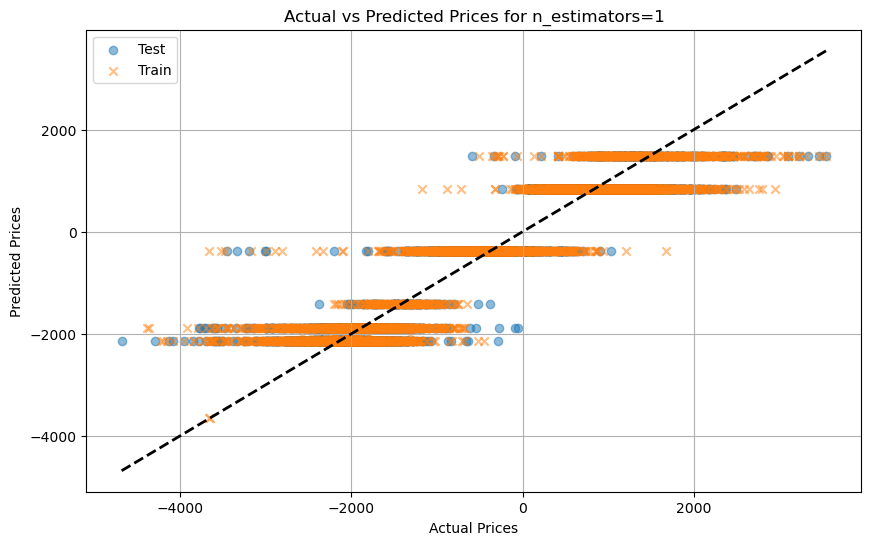

<Figure size 1000x600 with 0 Axes>

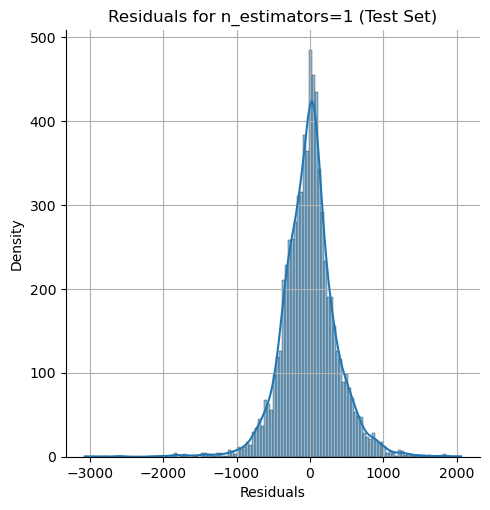

<Figure size 1000x600 with 0 Axes>

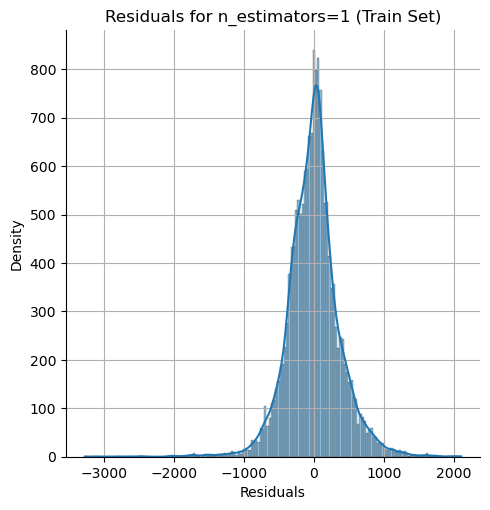

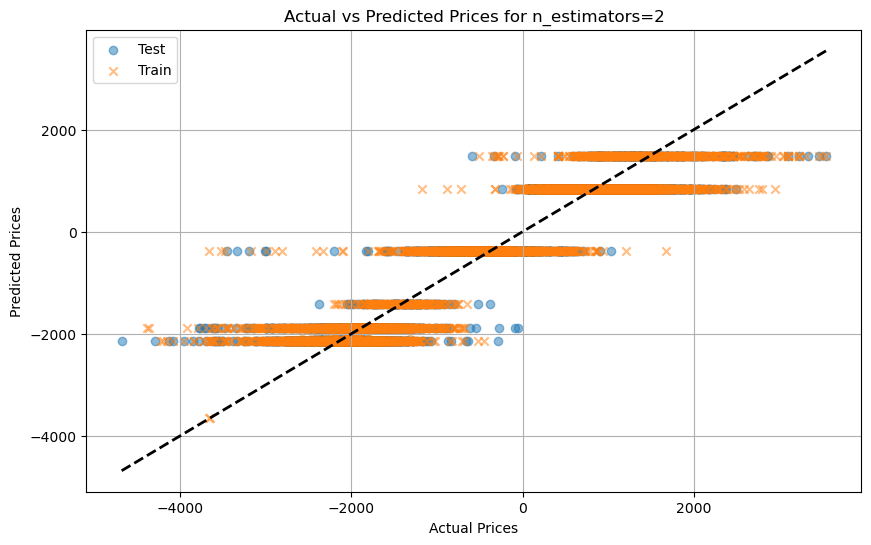

<Figure size 1000x600 with 0 Axes>

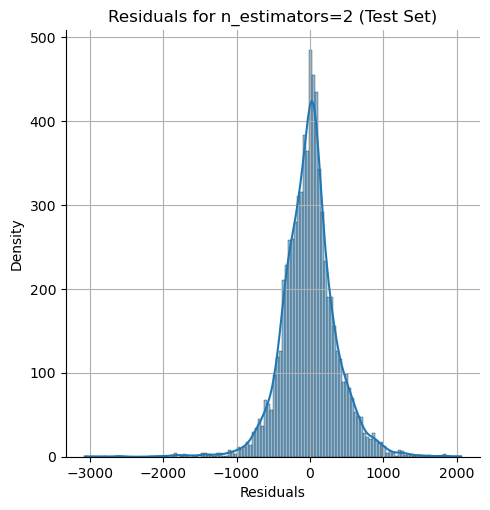

<Figure size 1000x600 with 0 Axes>

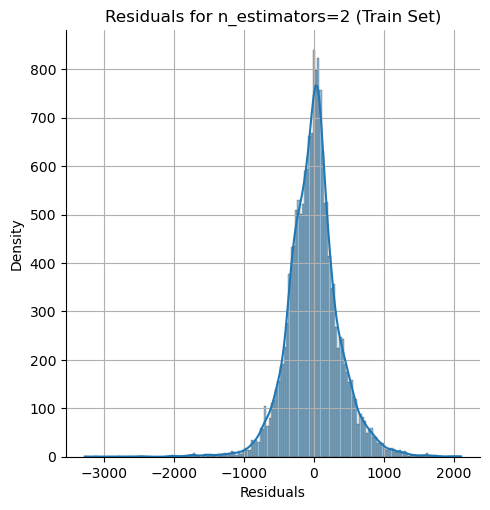

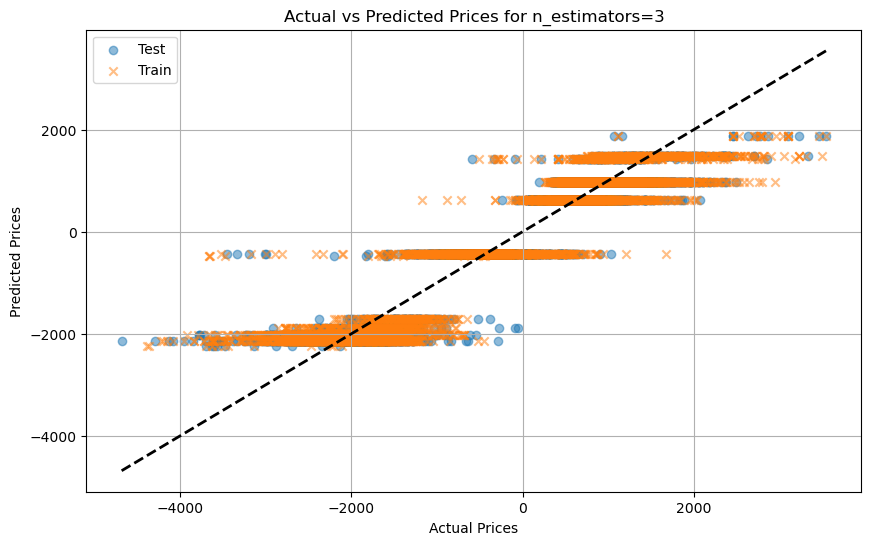

<Figure size 1000x600 with 0 Axes>

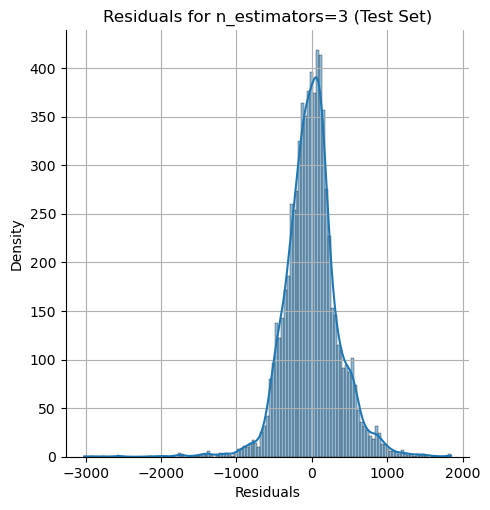

<Figure size 1000x600 with 0 Axes>

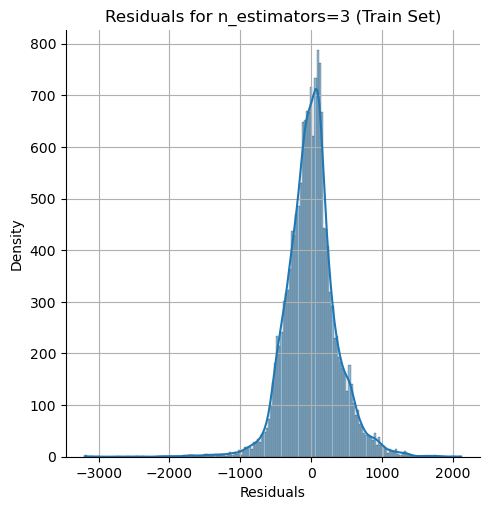

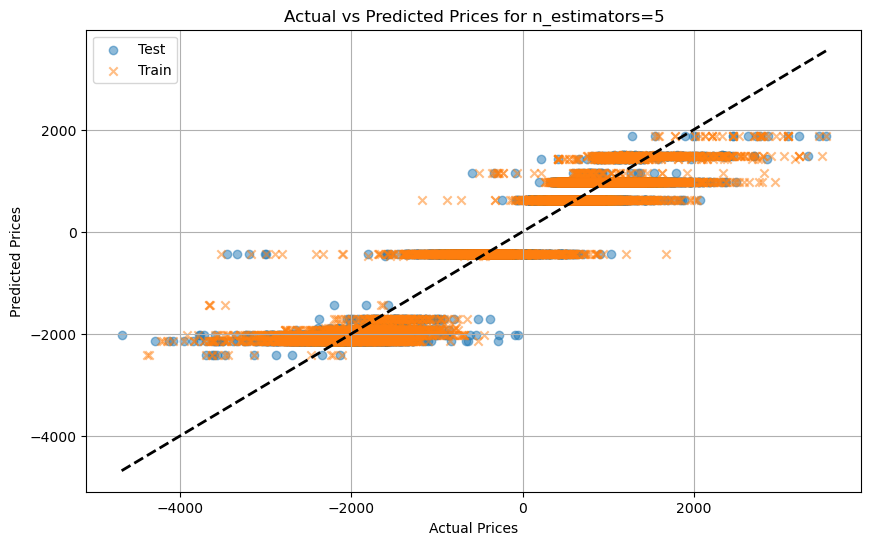

<Figure size 1000x600 with 0 Axes>

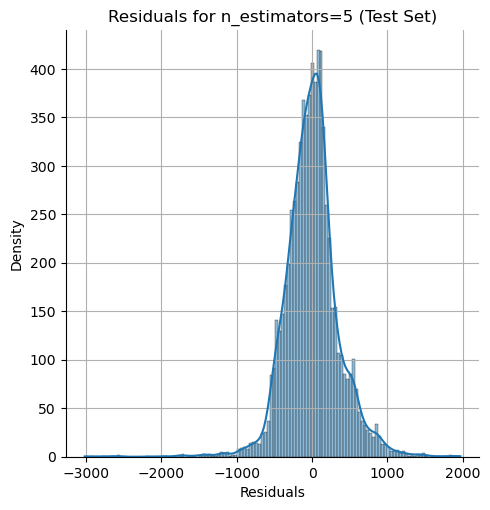

<Figure size 1000x600 with 0 Axes>

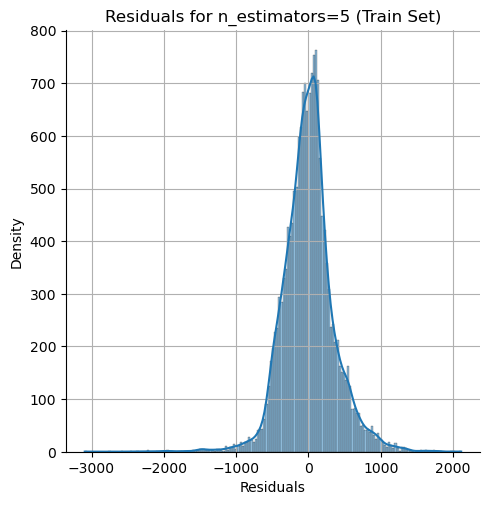

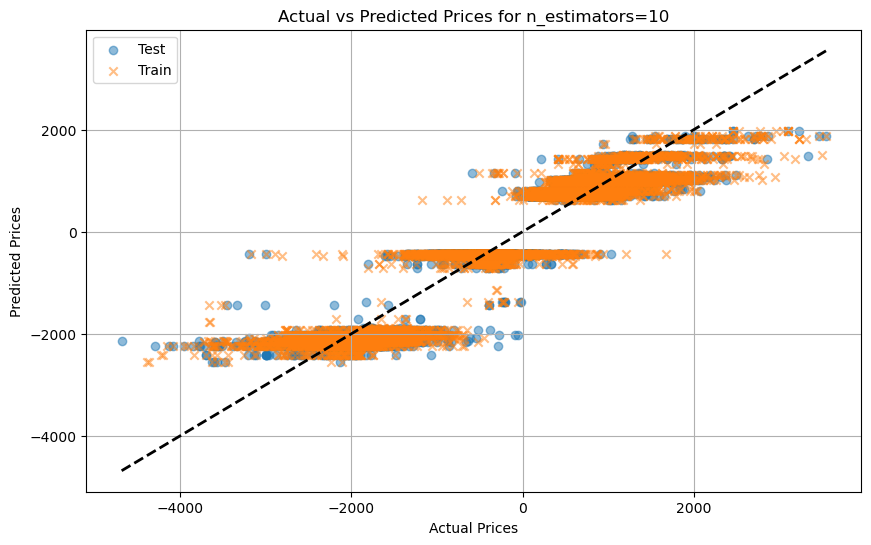

<Figure size 1000x600 with 0 Axes>

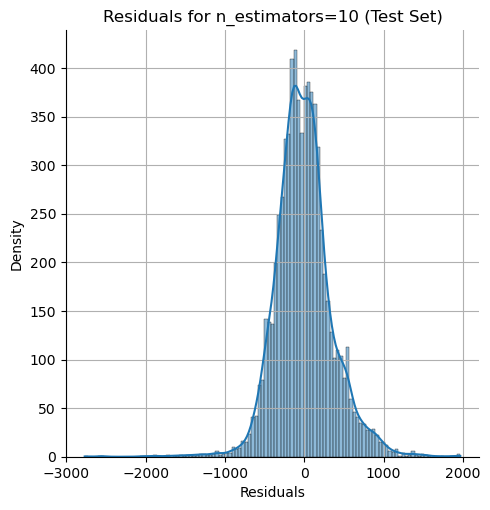

<Figure size 1000x600 with 0 Axes>

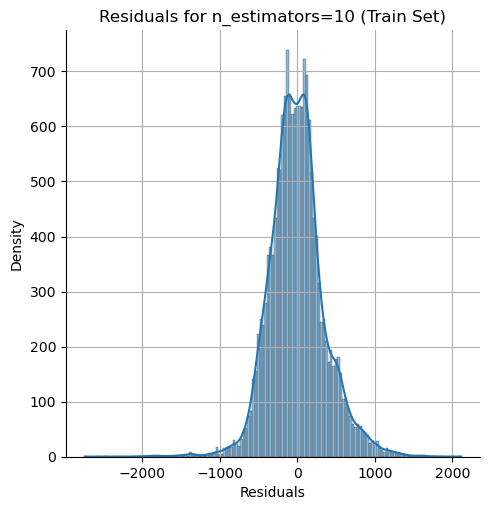

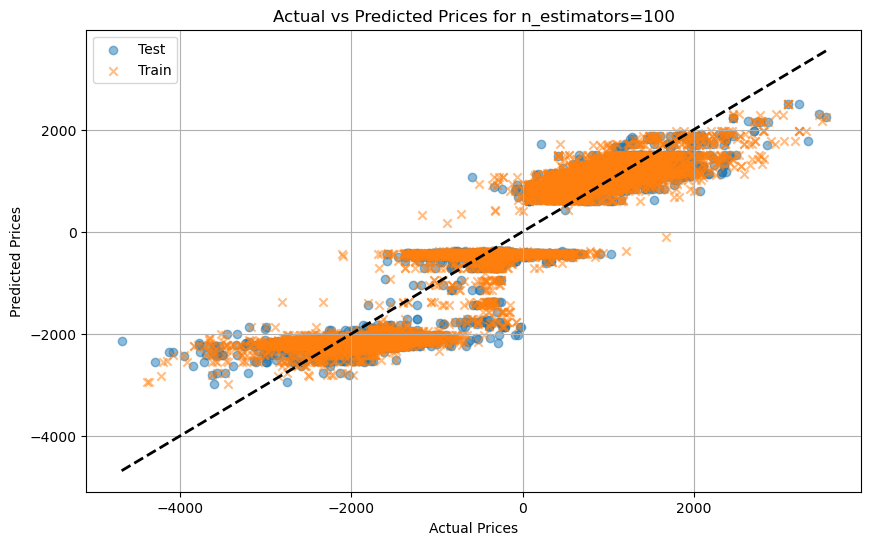

<Figure size 1000x600 with 0 Axes>

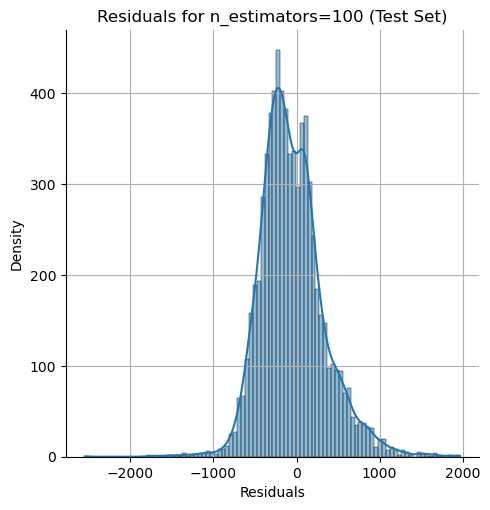

<Figure size 1000x600 with 0 Axes>

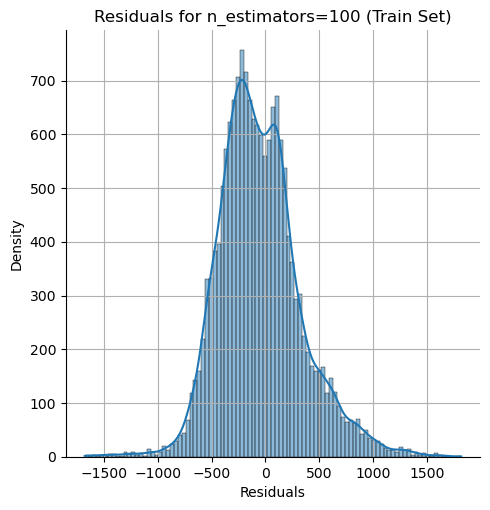

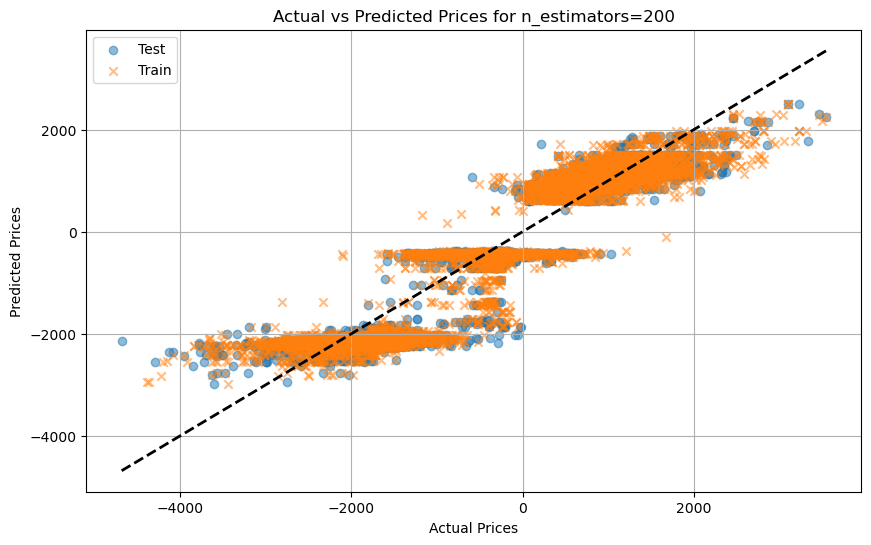

<Figure size 1000x600 with 0 Axes>

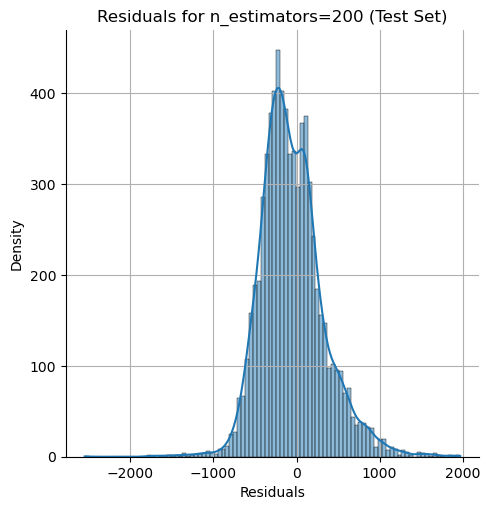

<Figure size 1000x600 with 0 Axes>

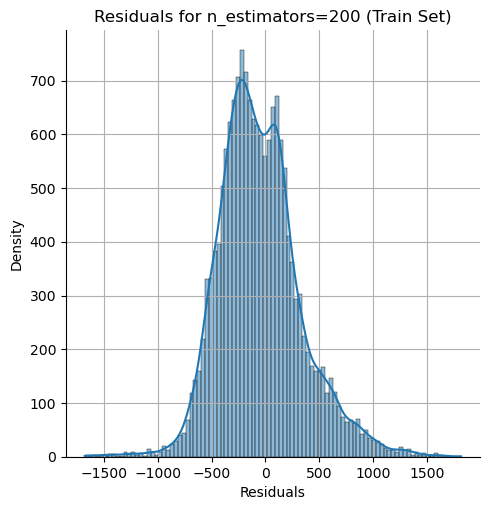

DataFrame: data_min_max_scaled
--------------------------------



C:\Users\ygastfraind\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\ygastfraind\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\ygastfraind\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\ygastfraind\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\ygastfraind\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Us

Test Set Results:
   n_estimators  Mean Squared Error  Root Mean Squared Error  \
0             1          134833.710                  367.197   
1             2          134833.710                  367.197   
2             3          139639.989                  373.684   
3             5          139433.400                  373.408   
4            10          134817.847                  367.175   
5           100          132831.510                  364.461   
6           200          132831.510                  364.461   

   Mean Absolute Error   R^2  
0              260.700 0.903  
1              260.700 0.903  
2              268.166 0.900  
3              270.951 0.900  
4              270.515 0.903  
5              274.223 0.905  
6              274.223 0.905  

Train Set Results:
   n_estimators  Mean Squared Error  Root Mean Squared Error  \
0             1          129826.013                  360.314   
1             2          129826.013                  360.314   
2        

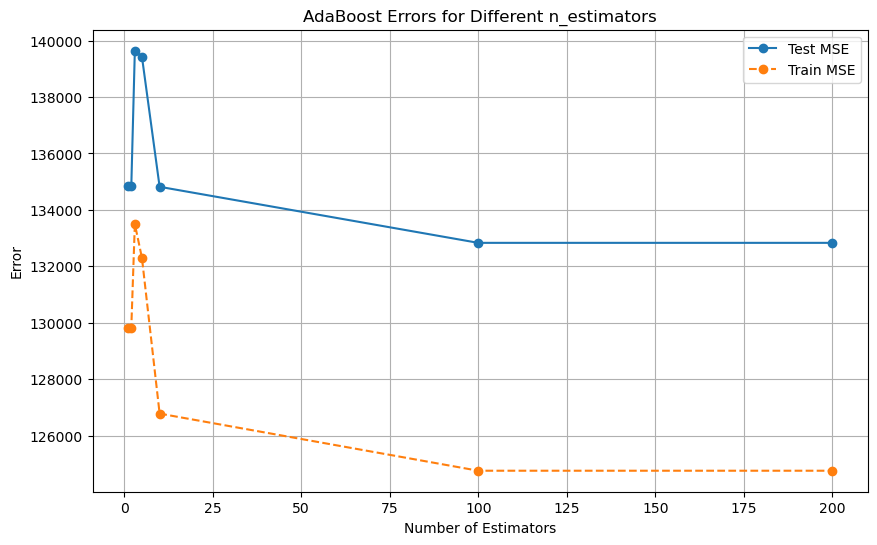

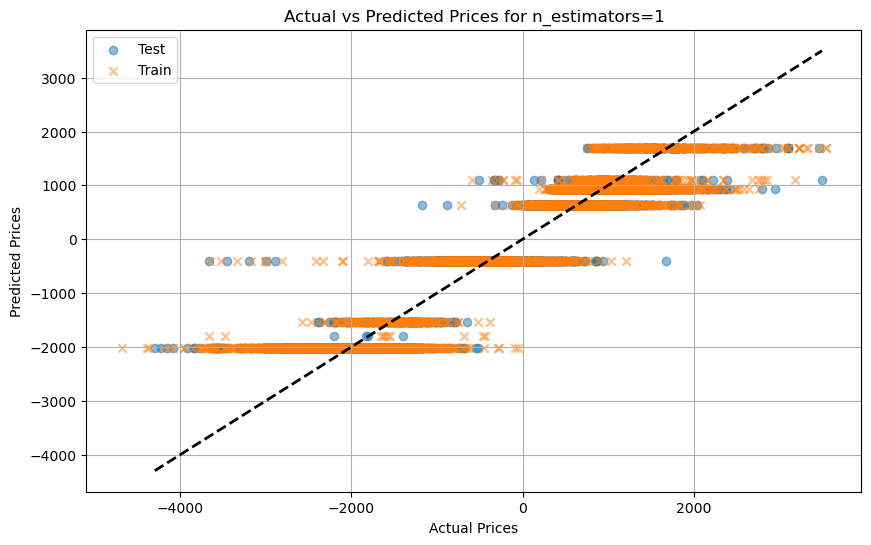

<Figure size 1000x600 with 0 Axes>

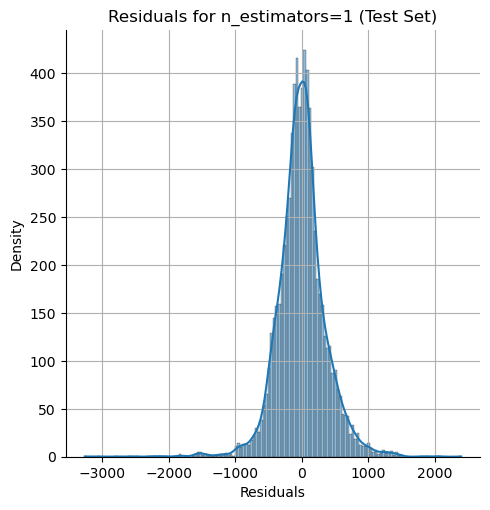

<Figure size 1000x600 with 0 Axes>

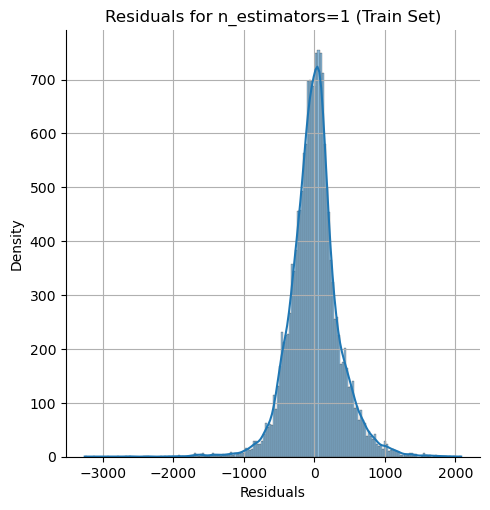

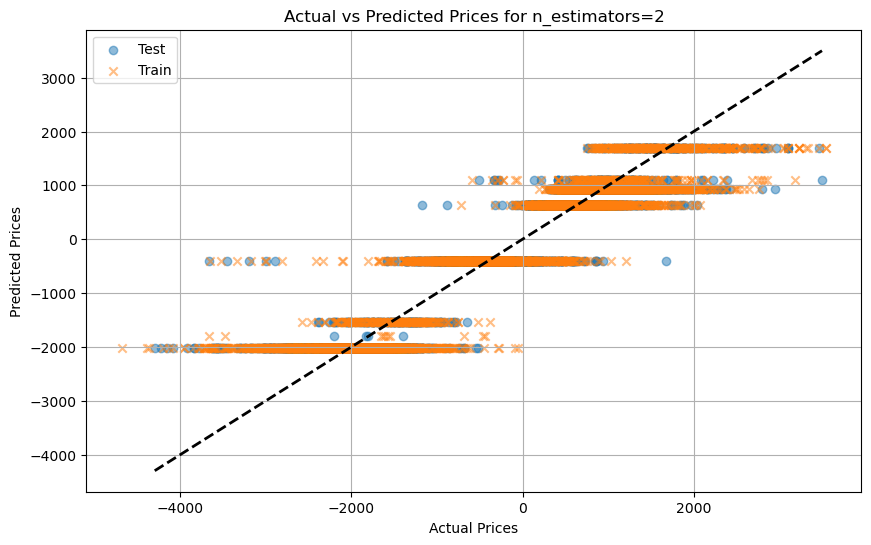

<Figure size 1000x600 with 0 Axes>

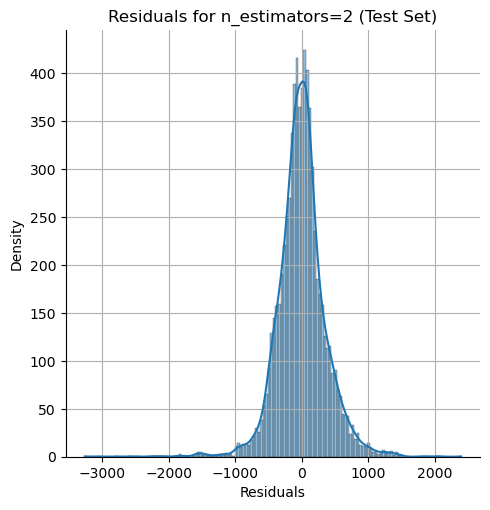

<Figure size 1000x600 with 0 Axes>

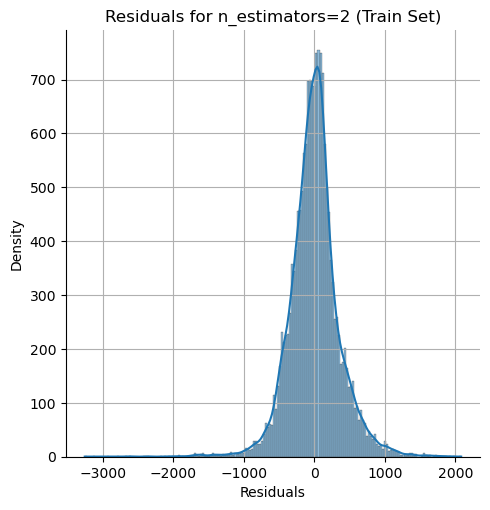

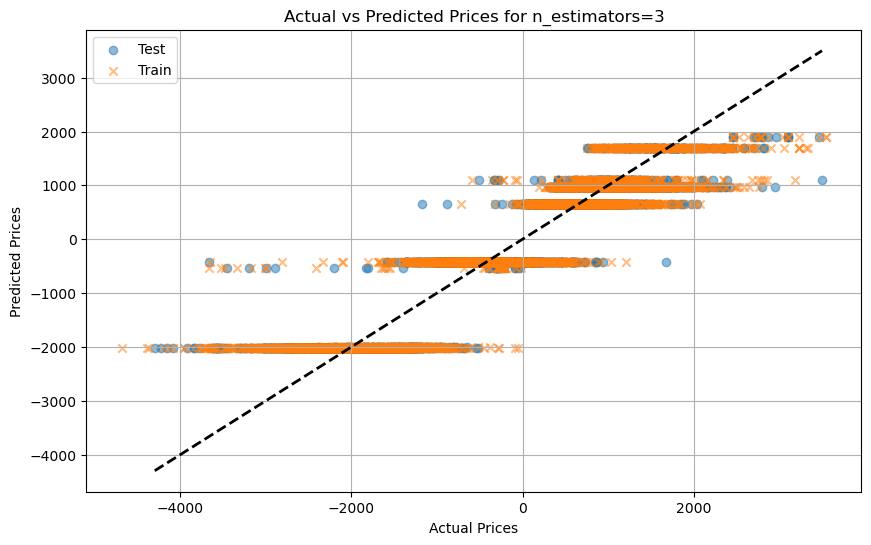

<Figure size 1000x600 with 0 Axes>

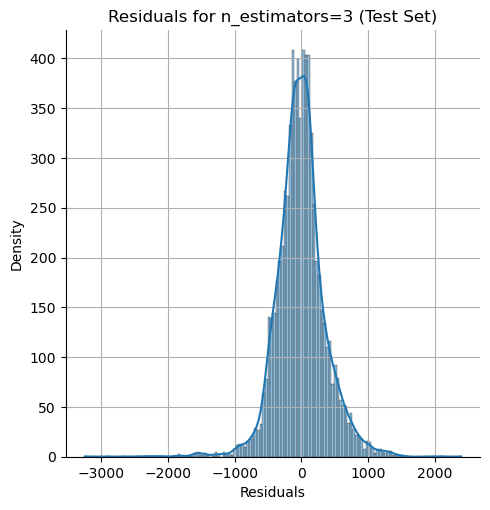

<Figure size 1000x600 with 0 Axes>

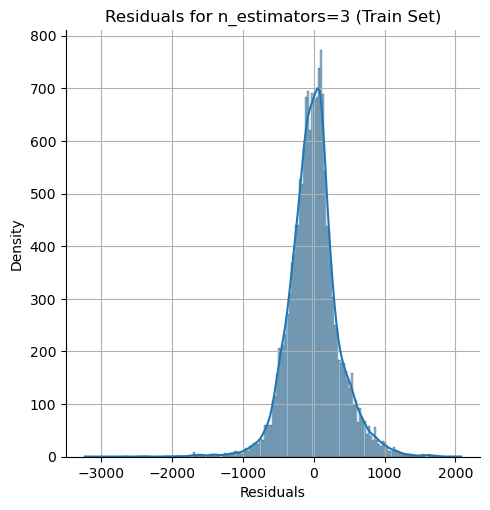

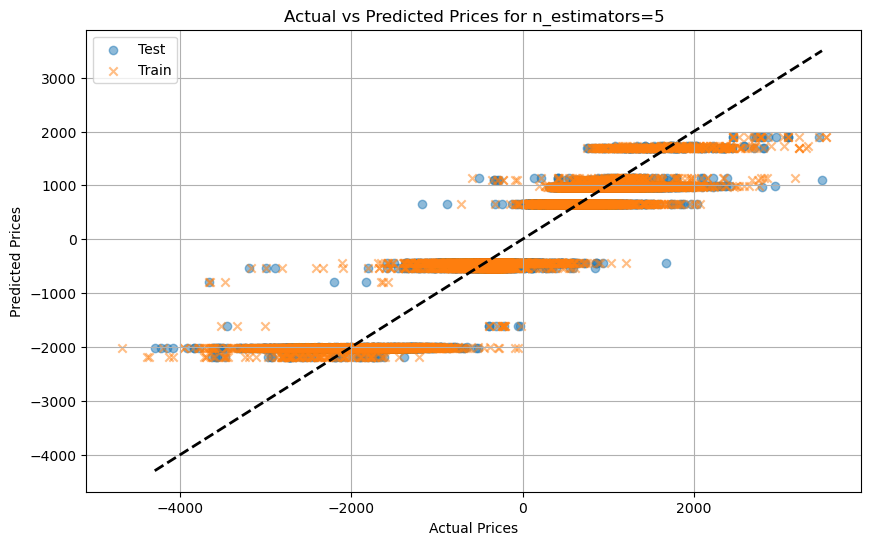

<Figure size 1000x600 with 0 Axes>

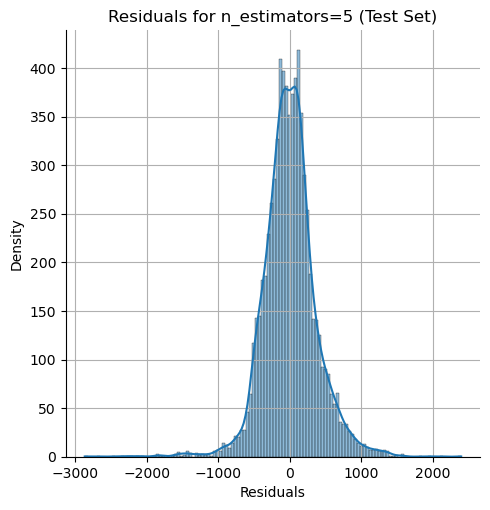

<Figure size 1000x600 with 0 Axes>

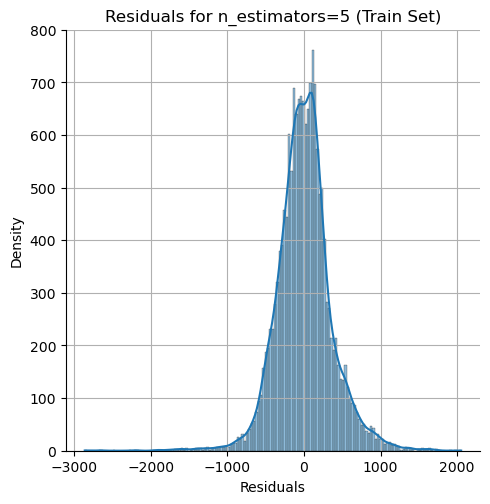

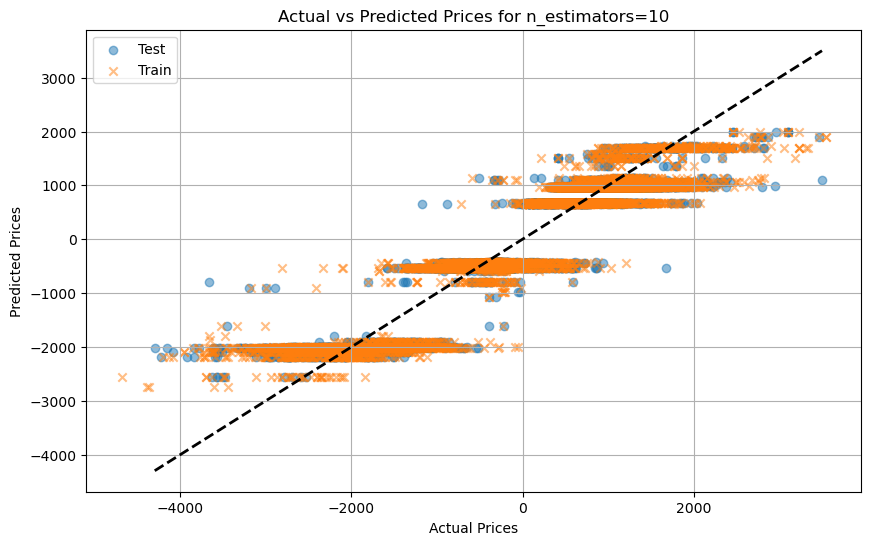

<Figure size 1000x600 with 0 Axes>

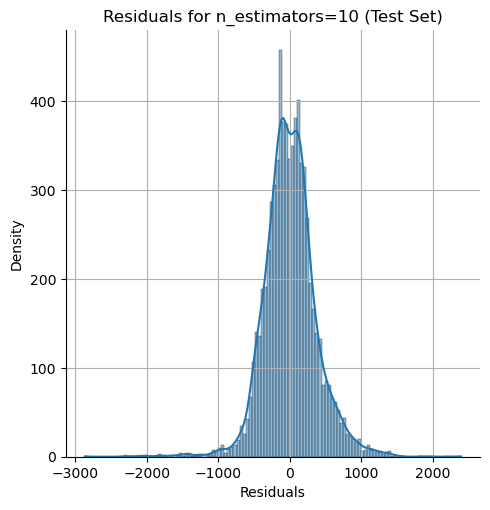

<Figure size 1000x600 with 0 Axes>

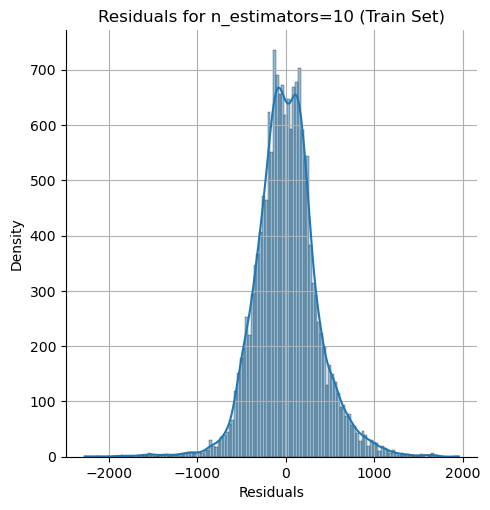

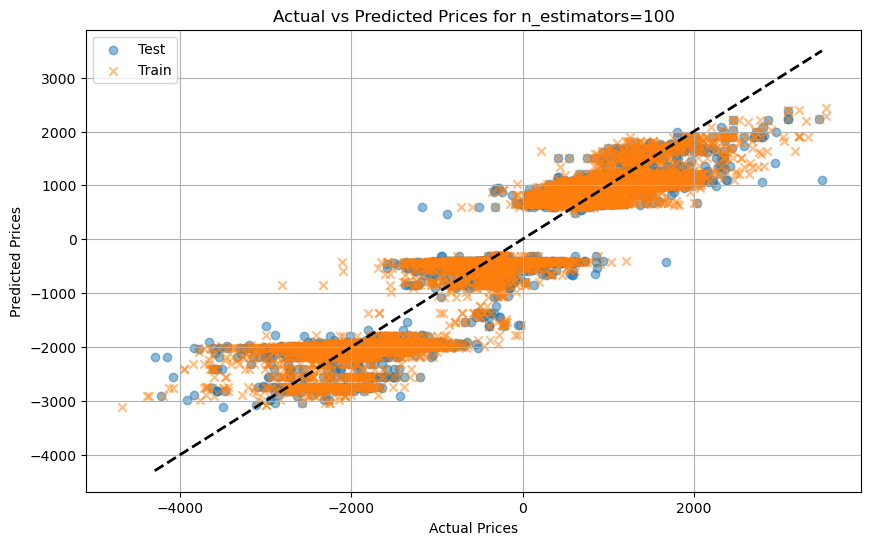

<Figure size 1000x600 with 0 Axes>

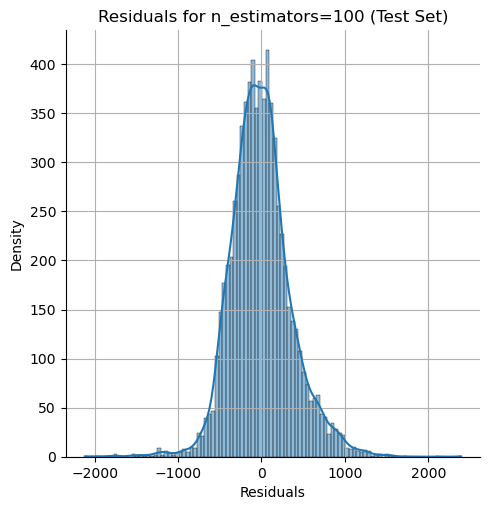

<Figure size 1000x600 with 0 Axes>

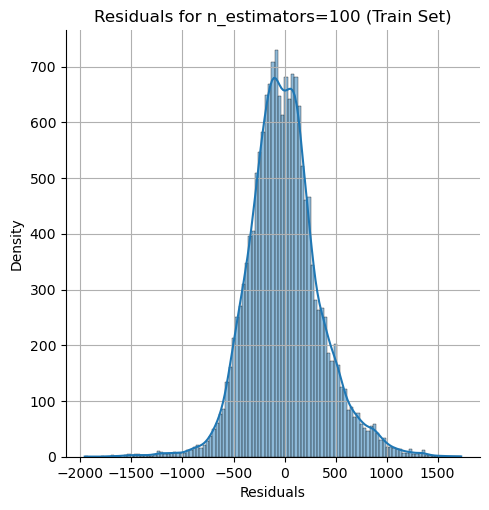

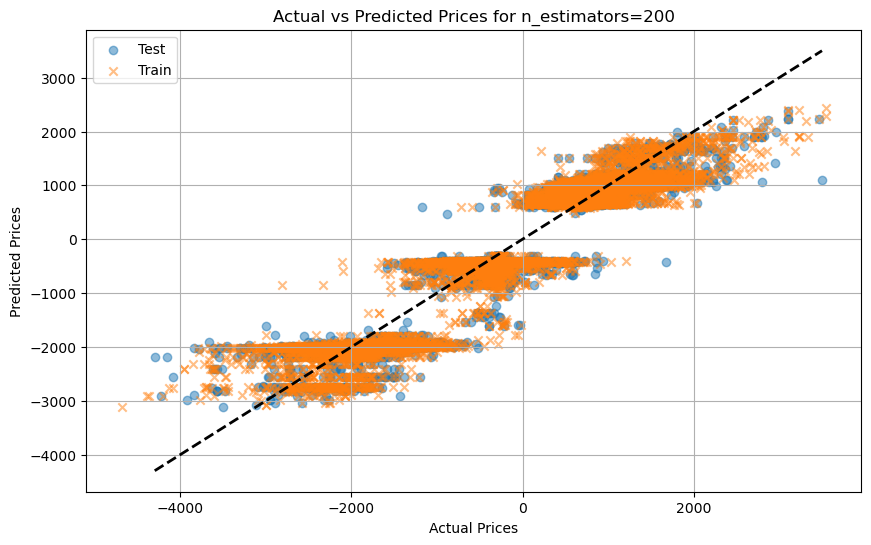

<Figure size 1000x600 with 0 Axes>

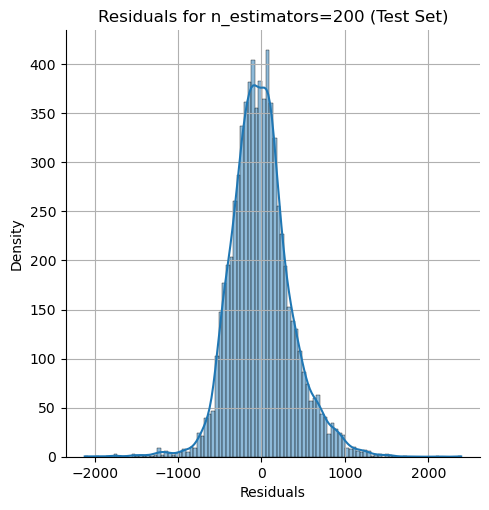

<Figure size 1000x600 with 0 Axes>

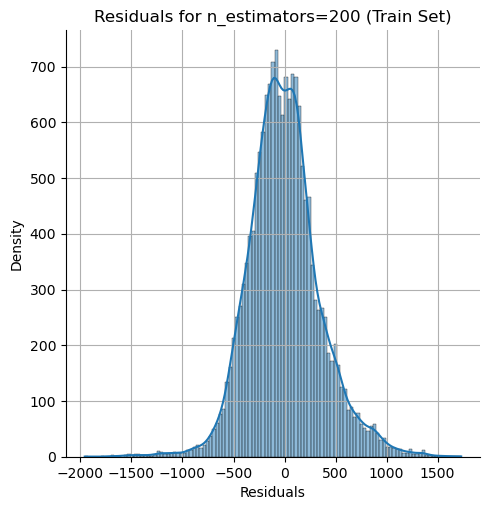

DataFrame: data_wo_features
--------------------------------



C:\Users\ygastfraind\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\ygastfraind\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\ygastfraind\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\ygastfraind\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Users\ygastfraind\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(
C:\Us

Test Set Results:
   n_estimators  Mean Squared Error  Root Mean Squared Error  \
0             1          133046.828                  364.756   
1             2          133046.828                  364.756   
2             3          128631.040                  358.652   
3             5          133002.713                  364.695   
4            10          128570.867                  358.568   
5           100          140264.325                  374.519   
6           200          160574.514                  400.717   

   Mean Absolute Error   R^2  
0              257.339 0.906  
1              257.339 0.906  
2              256.193 0.909  
3              266.252 0.906  
4              263.760 0.909  
5              292.115 0.901  
6              319.970 0.886  

Train Set Results:
   n_estimators  Mean Squared Error  Root Mean Squared Error  \
0             1          133895.862                  365.918   
1             2          133895.862                  365.918   
2        

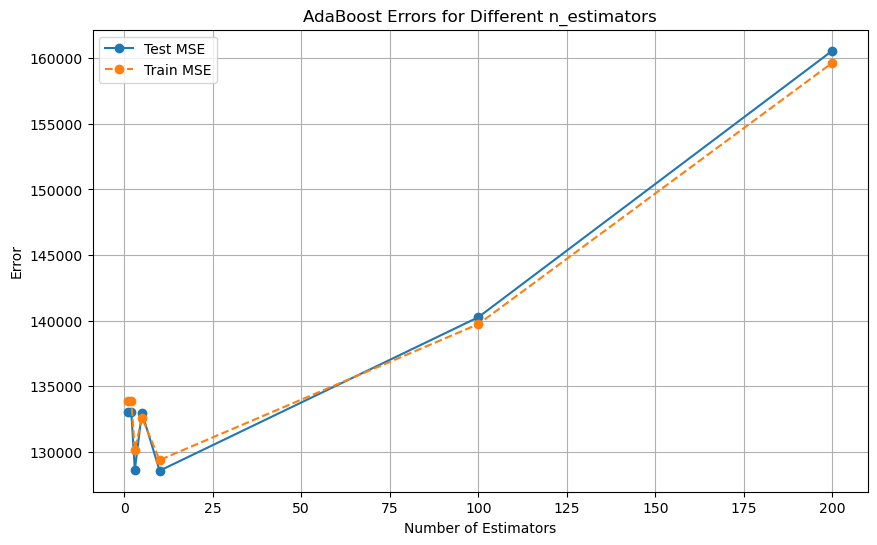

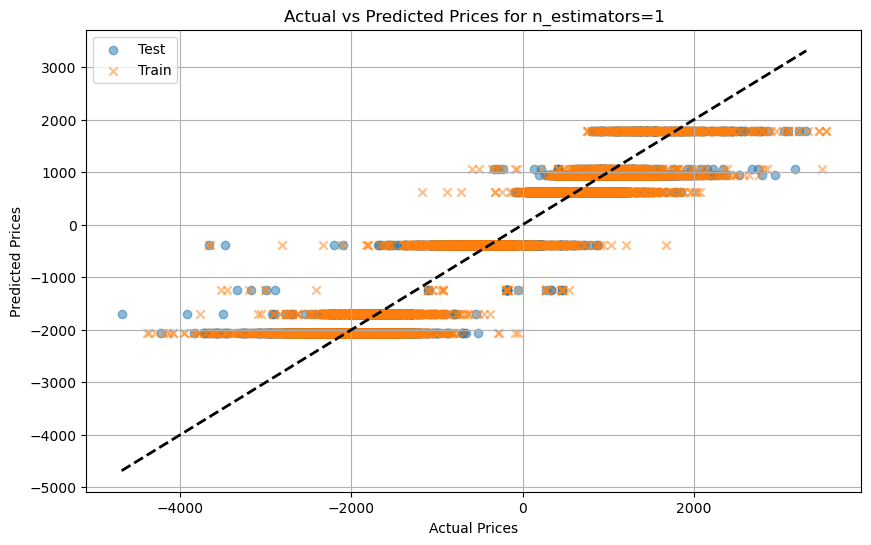

<Figure size 1000x600 with 0 Axes>

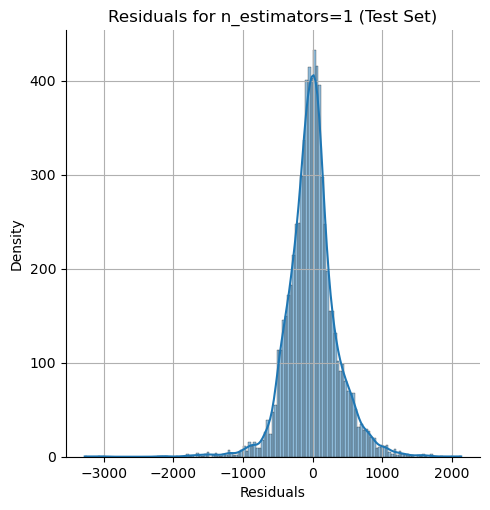

<Figure size 1000x600 with 0 Axes>

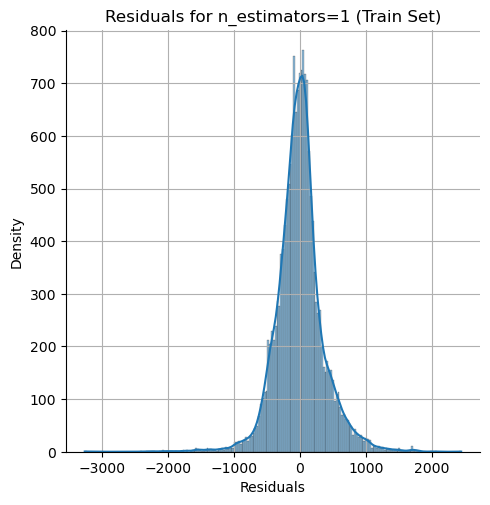

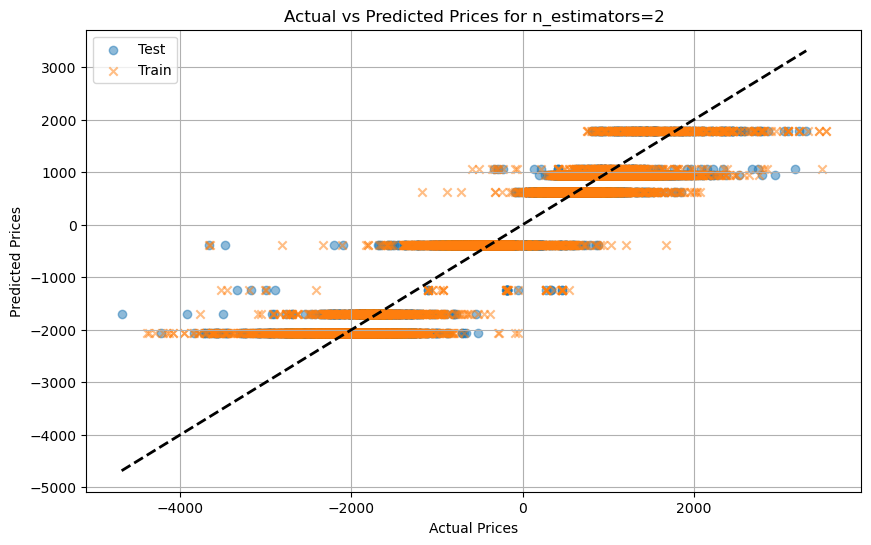

<Figure size 1000x600 with 0 Axes>

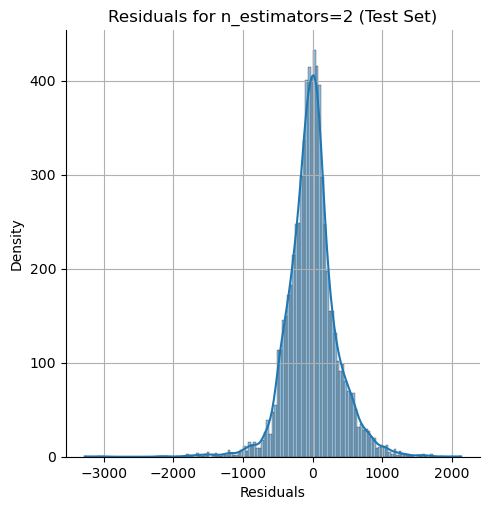

<Figure size 1000x600 with 0 Axes>

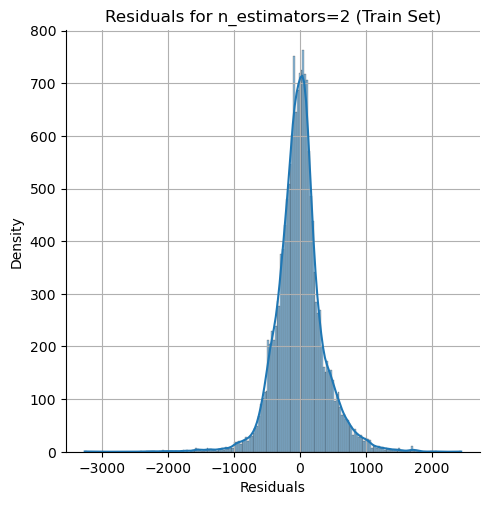

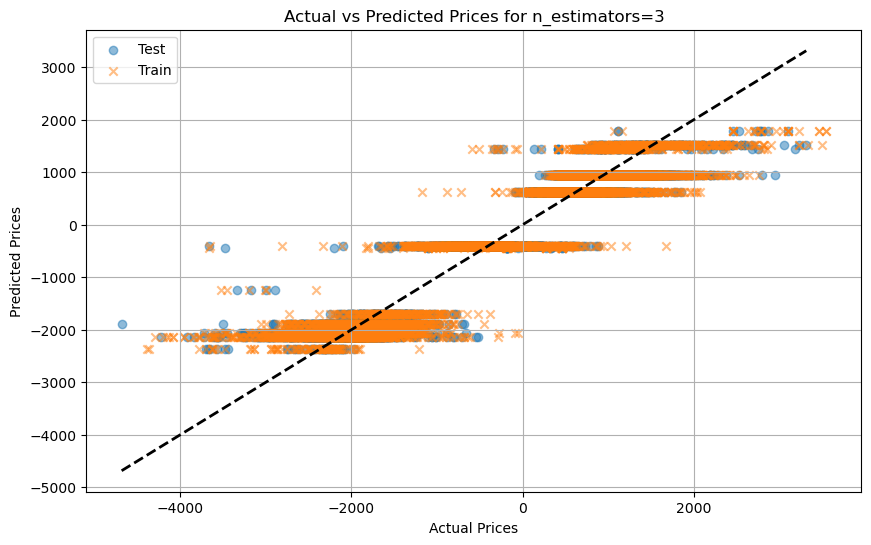

<Figure size 1000x600 with 0 Axes>

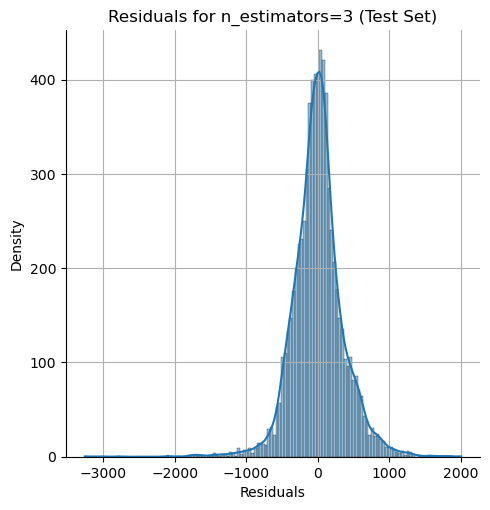

<Figure size 1000x600 with 0 Axes>

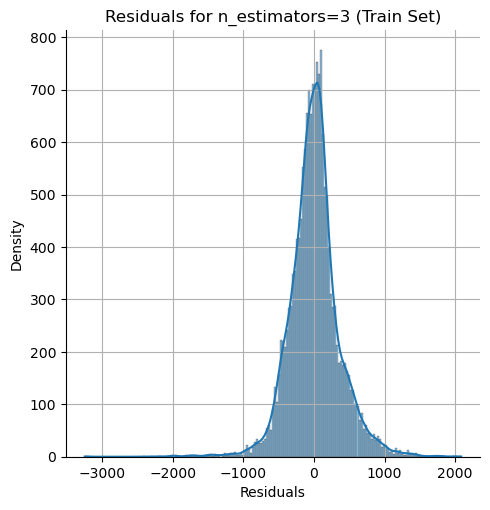

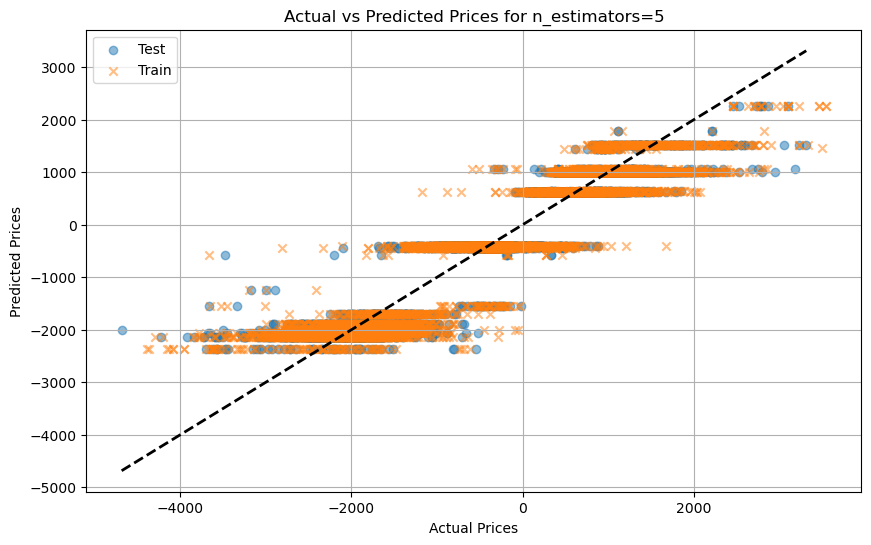

<Figure size 1000x600 with 0 Axes>

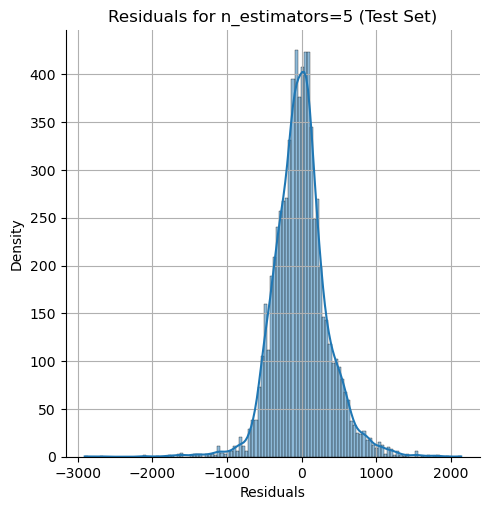

<Figure size 1000x600 with 0 Axes>

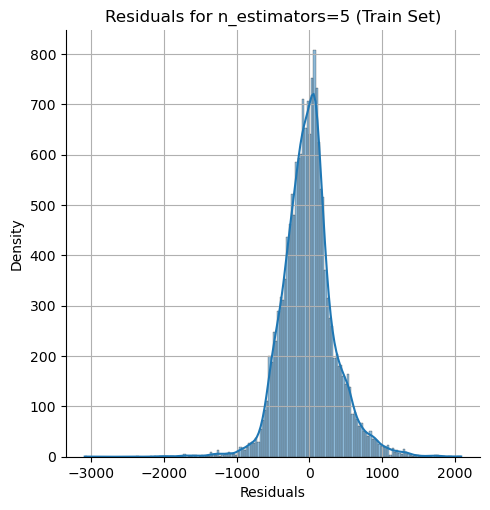

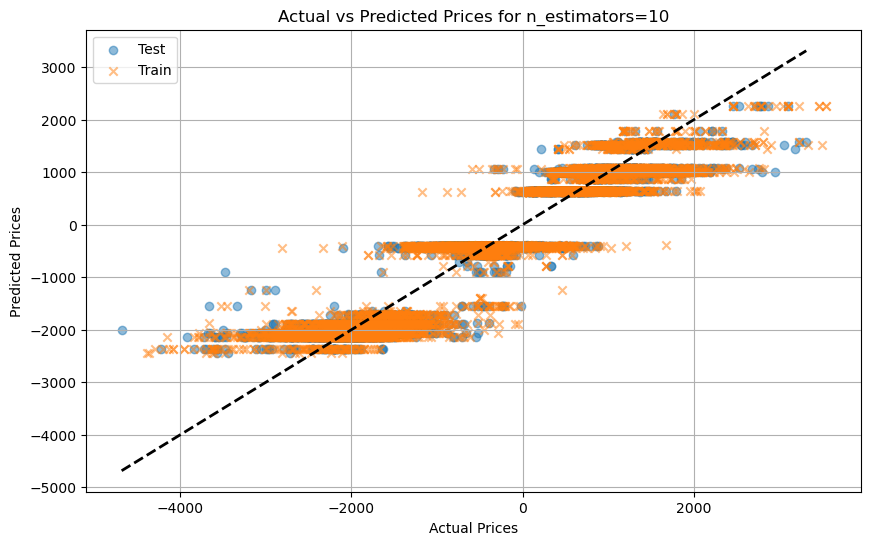

<Figure size 1000x600 with 0 Axes>

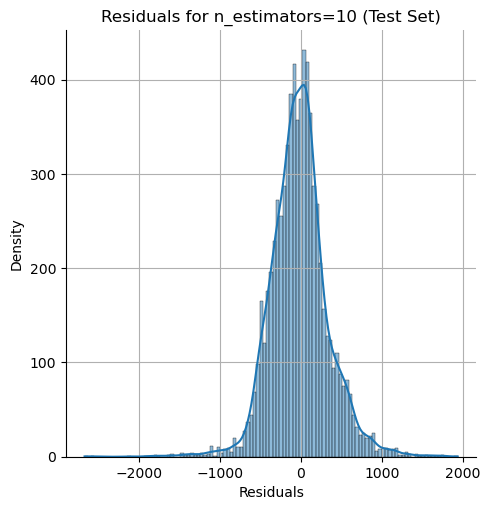

<Figure size 1000x600 with 0 Axes>

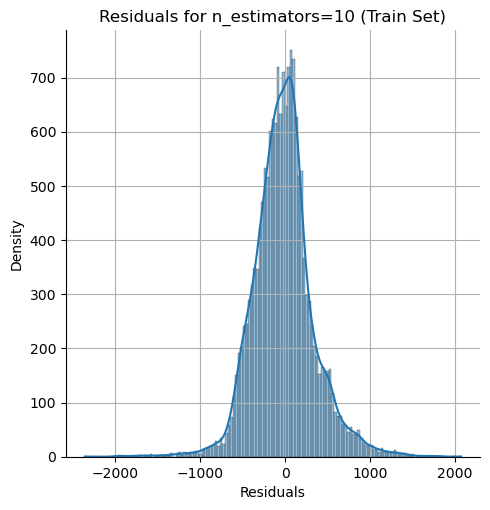

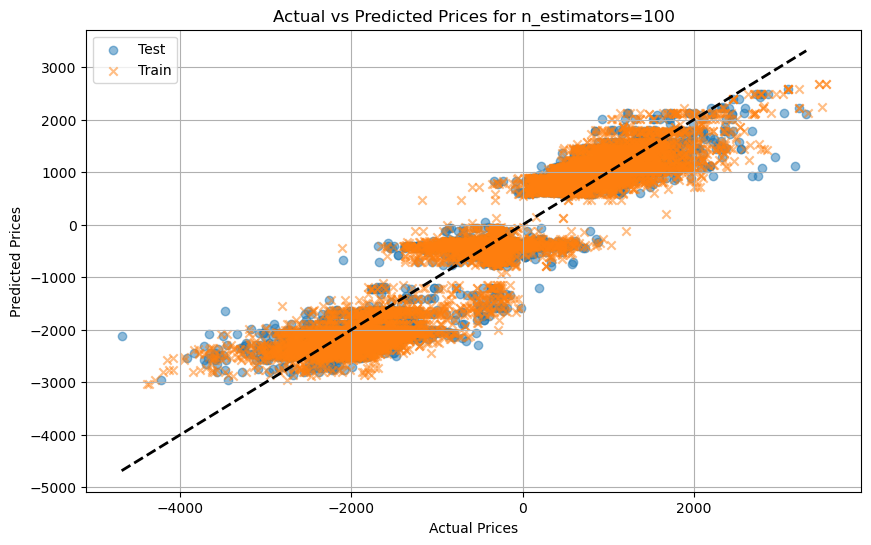

<Figure size 1000x600 with 0 Axes>

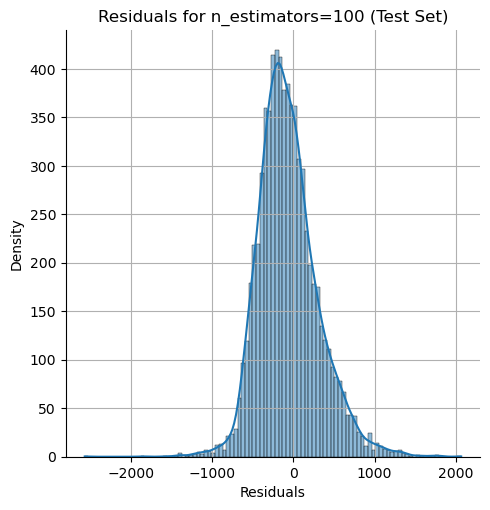

<Figure size 1000x600 with 0 Axes>

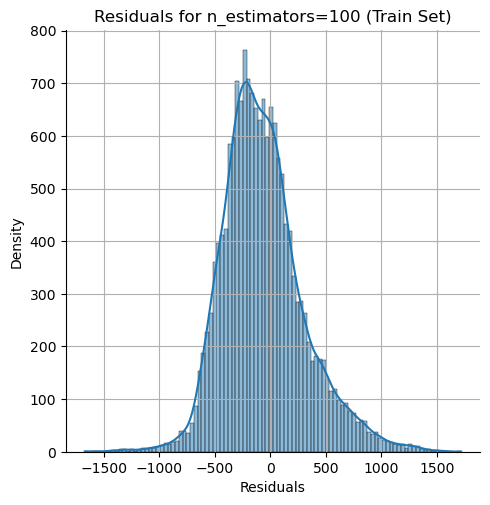

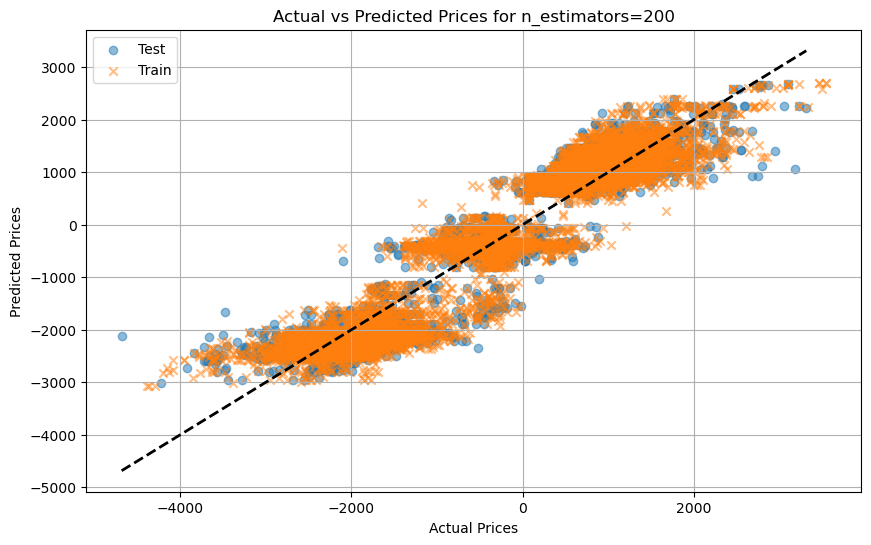

<Figure size 1000x600 with 0 Axes>

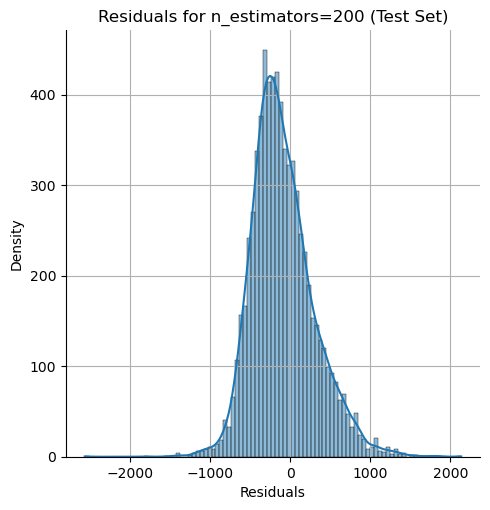

<Figure size 1000x600 with 0 Axes>

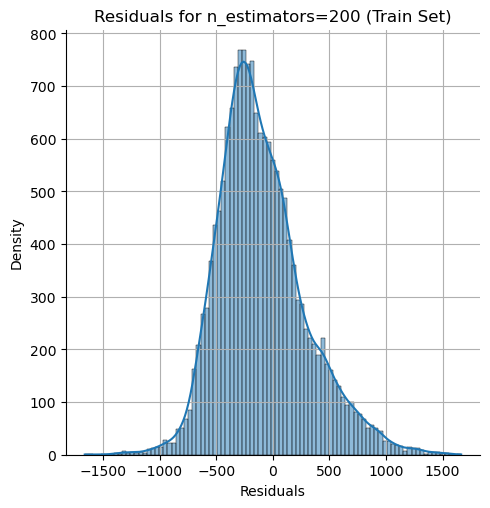

In [16]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import AdaBoostRegressor

data_types = [merged_data, data_min_max_scaled, data_wo_features]

for df in data_types:
    df_name = next(key for key, value in locals().items() if value is df)
    print(f"DataFrame: {df_name}")
    print("--------------------------------")
    print()
    
    X = df.drop('price_diff', axis=1)
    y = df['price_diff']
    
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3)

    def evaluate_adaboost(n_estimators_list, X_train, y_train, X_test, y_test):
        results = {}
        for n_estimators in n_estimators_list:
            adaboost = AdaBoostRegressor(
                base_estimator=DecisionTreeRegressor(max_depth=3),
                n_estimators=n_estimators,
                random_state=42
            )
            adaboost.fit(X_train, y_train)
            
            # Evaluate on test set
            y_pred_test = adaboost.predict(X_test)
            mse_test = mean_squared_error(y_test, y_pred_test)
            rmse_test = np.sqrt(mse_test)
            mae_test = mean_absolute_error(y_test, y_pred_test)
            r2_test = r2_score(y_test, y_pred_test)
            
            # Evaluate on train set
            y_pred_train = adaboost.predict(X_train)
            mse_train = mean_squared_error(y_train, y_pred_train)
            rmse_train = np.sqrt(mse_train)
            mae_train = mean_absolute_error(y_train, y_pred_train)
            r2_train = r2_score(y_train, y_pred_train)
            
            results[n_estimators] = {
                'test': {'mse': mse_test, 'rmse': rmse_test, 'mae': mae_test, 'r2': r2_test, 'y_pred': y_pred_test},
                'train': {'mse': mse_train, 'rmse': rmse_train, 'mae': mae_train, 'r2': r2_train, 'y_pred': y_pred_train}
            }
        return results
    
    n_estimators_list = [1, 2, 3, 5, 10, 100 ,200]
    
    results = evaluate_adaboost(n_estimators_list, X_train, y_train, X_test, y_test)
    
    results_df_test = pd.DataFrame([(n, res['test']['mse'], res['test']['rmse'], res['test']['mae'], res['test']['r2']) for n, res in results.items()], 
                              columns=['n_estimators', 'Mean Squared Error', 'Root Mean Squared Error', 'Mean Absolute Error', 'R^2'])
    
    results_df_train = pd.DataFrame([(n, res['train']['mse'], res['train']['rmse'], res['train']['mae'], res['train']['r2']) for n, res in results.items()],
                              columns=['n_estimators', 'Mean Squared Error', 'Root Mean Squared Error', 'Mean Absolute Error', 'R^2'])
    
    print("Test Set Results:")
    print(results_df_test)
    print()
    
    print("Train Set Results:")
    print(results_df_train)
    print()
    
    # Plot the Mean Squared Error for different values of n_estimators for test set
    plt.figure(figsize=(10, 6))
    plt.plot(results_df_test['n_estimators'], results_df_test['Mean Squared Error'], marker='o', label='Test MSE')
    plt.plot(results_df_train['n_estimators'], results_df_train['Mean Squared Error'], marker='o', label='Train MSE', linestyle='--')
    plt.title('AdaBoost Errors for Different n_estimators')
    plt.xlabel('Number of Estimators')
    plt.ylabel('Error')
    plt.legend()
    plt.grid(True)
    plt.show()
    
    # Plot scatter plots of actual vs predicted values for each n_estimators for both train and test sets
    for n_estimators in n_estimators_list:
        plt.figure(figsize=(10, 6))
        plt.scatter(y_test, results[n_estimators]['test']['y_pred'], alpha=0.5, label='Test')
        plt.scatter(y_train, results[n_estimators]['train']['y_pred'], alpha=0.5, label='Train', marker='x')
        plt.title(f'Actual vs Predicted Prices for n_estimators={n_estimators}')
        plt.xlabel('Actual Prices')
        plt.ylabel('Predicted Prices')
        plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
        plt.legend()
        plt.grid(True)
        plt.show()
    
        # Plot residuals for test set
        residuals_test = y_test - results[n_estimators]['test']['y_pred']
        plt.figure(figsize=(10, 6))
        sns.displot(residuals_test, kde=True)
        plt.title(f'Residuals for n_estimators={n_estimators} (Test Set)')
        plt.xlabel('Residuals')
        plt.ylabel('Density')
        plt.grid(True)
        plt.show()
        
        # Plot residuals for train set
        residuals_train = y_train - results[n_estimators]['train']['y_pred']
        plt.figure(figsize=(10, 6))
        sns.displot(residuals_train, kde=True)
        plt.title(f'Residuals for n_estimators={n_estimators} (Train Set)')
        plt.xlabel('Residuals')
        plt.ylabel('Density')
        plt.grid(True)
        plt.show()



## Use feature importance

C:\Users\ygastfraind\anaconda3\Lib\site-packages\sklearn\ensemble\_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


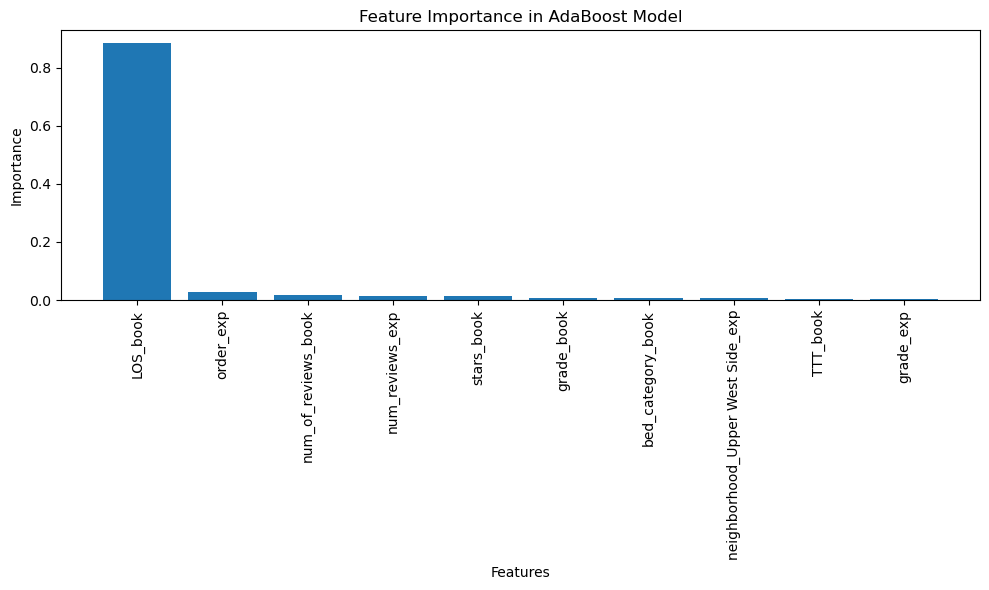

                             feature  importance
9                           LOS_book       0.884
45                         order_exp       0.027
2                num_of_reviews_book       0.018
39                   num_reviews_exp       0.013
5                         stars_book       0.013
0                         grade_book       0.007
12                 bed_category_book       0.007
61  neighborhood_Upper West Side_exp       0.006
8                           TTT_book       0.005
42                         grade_exp       0.005


In [17]:
best_n_estimators = 10
best_model = AdaBoostRegressor(
    base_estimator=DecisionTreeRegressor(max_depth=4),
    n_estimators=best_n_estimators
)
best_model.fit(X_train, y_train)

# חשב את חשיבות התכונות
feature_importance = best_model.feature_importances_

# צור DataFrame עם שמות התכונות וחשיבותן
feature_names = X.columns
importance_df = pd.DataFrame({'feature': feature_names, 'importance': feature_importance})

# מיין לפי חשיבות בסדר יורד
importance_df = importance_df.sort_values('importance', ascending=False)[:10]

# הצג את חשיבות התכונות בגרף
plt.figure(figsize=(10, 6))
plt.bar(importance_df['feature'], importance_df['importance'])
plt.xticks(rotation=90)
plt.xlabel('Features')
plt.ylabel('Importance')
plt.title('Feature Importance in AdaBoost Model')
plt.tight_layout()
plt.show()

# הדפס את חשיבות התכונות
print(importance_df)

## Use feature importance - Black box

                      feature  importance
9                    LOS_book       1.904
5                  stars_book       0.022
2         num_of_reviews_book       0.009
45                  order_exp       0.004
39            num_reviews_exp       0.003
4   distance_from_center_book       0.003
42                  grade_exp       0.003
0                  grade_book       0.003
8                    TTT_book       0.002
11         room_category_book       0.001


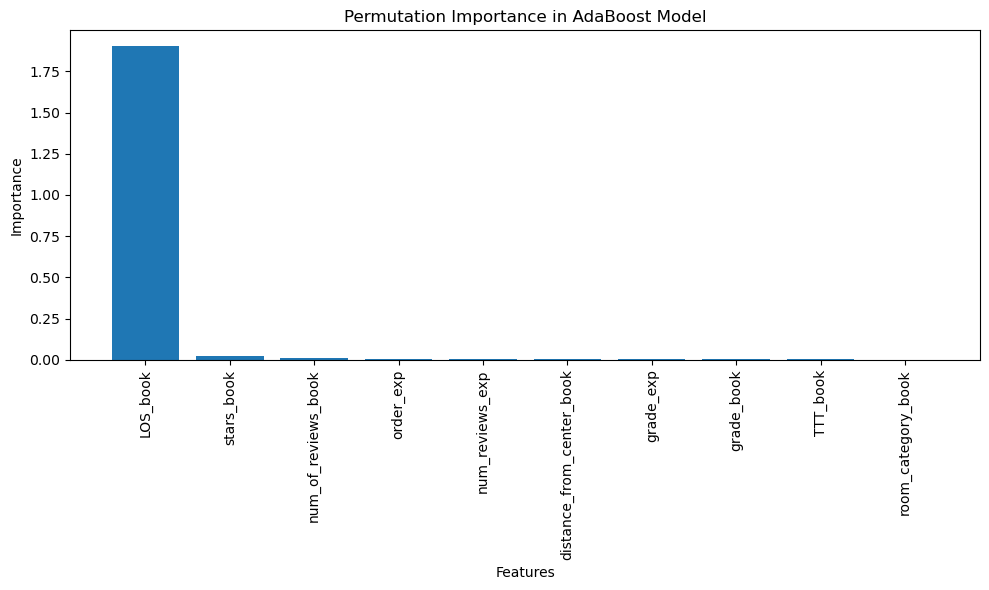

In [18]:
from sklearn.inspection import permutation_importance

# חישוב חשיבות התכונות באמצעות Permutation Importance
perm_importance = permutation_importance(best_model, X_test, y_test, n_repeats=5)

# יצירת DataFrame לחשיבות התכונות
feature_importance_df = pd.DataFrame({
    'feature': X.columns,
    'importance': perm_importance.importances_mean
}).sort_values(by='importance', ascending=False)[:10]

# הצגת הטבלה
print(feature_importance_df)

# גרף הצגת חשיבות התכונות
plt.figure(figsize=(10, 6))
plt.bar(feature_importance_df['feature'], feature_importance_df['importance'])
plt.xticks(rotation=90)
plt.xlabel('Features')
plt.ylabel('Importance')
plt.title('Permutation Importance in AdaBoost Model')
plt.tight_layout()
plt.show()

# Algorithm - XGBoost (Extreme Gradient Boosting)

Test MAE:  184.7658
Test MSE:  79430.8552
Test RMSE:  281.8348
Test R2:  0.9438

Train MAE:  181.2396
Train MSE:  73988.0554
Train RMSE:  272.0075
Train R2:  0.9473


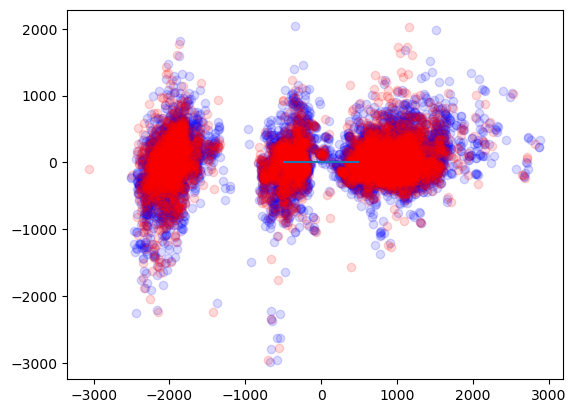

C:\Users\ygastfraind\anaconda3\Lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


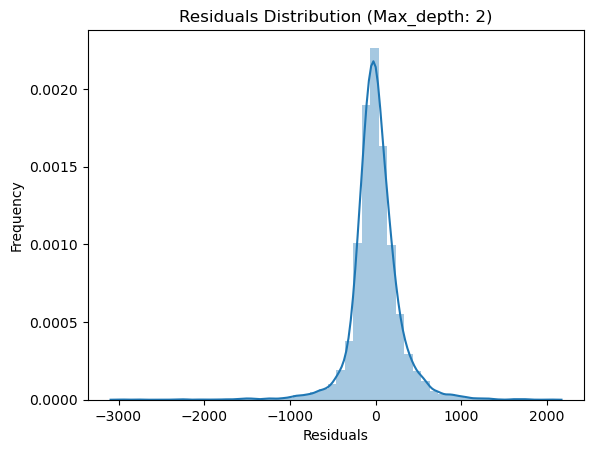

In [28]:
import xgboost as xgb

X = data_min_max_scaled.drop('price_diff', axis=1)
y = data_min_max_scaled['price_diff']

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3)

# Define the Gradient Boosting model
model = xgb.XGBRegressor(objective='reg:squarederror', n_estimators=100, max_depth=2)

# Train the model
model.fit(X_train, y_train)

# Make predictions
pred_train = model.predict(X_train)
pred_test = model.predict(X_test)

# Evaluate the model
print('Test MAE: ', "%.4f" % mean_absolute_error(y_test, pred_test))
print('Test MSE: ', "%.4f" % mean_squared_error(y_test, pred_test))
print('Test RMSE: ', "%.4f" % np.sqrt(mean_squared_error(y_test, pred_test)))
print('Test R2: ', "%.4f" % r2_score(y_test, pred_test))
print()
print('Train MAE: ', "%.4f" % mean_absolute_error(y_train, pred_train))
print('Train MSE: ', "%.4f" % mean_squared_error(y_train, pred_train))
print('Train RMSE: ', "%.4f" % np.sqrt(mean_squared_error(y_train, pred_train)))
print('Train R2: ', "%.4f" % r2_score(y_train, pred_train))

# Print scatter plot
plt.scatter(pred_train, y_train-pred_train, c='b',alpha=0.15)
plt.scatter(pred_test, y_test-pred_test, c='r',alpha=0.15)
plt.hlines(y=0,xmin=-500,xmax=500)
plt.show()
print()

# Print a histogram the residuals
sns.distplot(y_test-pred_test)
plt.title(f"Residuals Distribution (Max_depth: {2})")
plt.xlabel('Residuals')
plt.ylabel('Frequency')
plt.show()
print()

# Algorithm - XGBoost (Extreme Gradient Boosting)

## Split the data to training set and test set: TTT < 25 for test

Test MAE:  214.1301
Test MSE:  110393.0098
Test RMSE:  332.2544
Test R2:  0.9232

Train MAE:  131.4075
Train MSE:  35139.1491
Train RMSE:  187.4544
Train R2:  0.9721


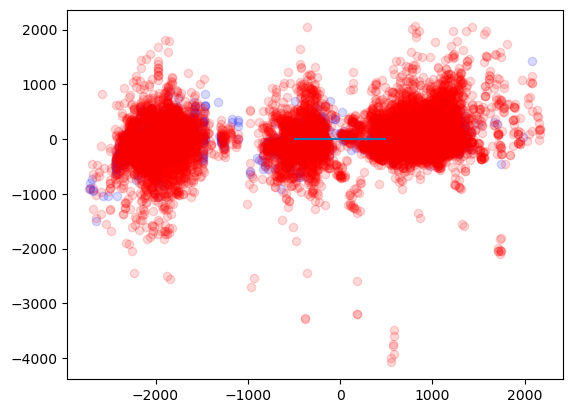

C:\Users\ygastfraind\anaconda3\Lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


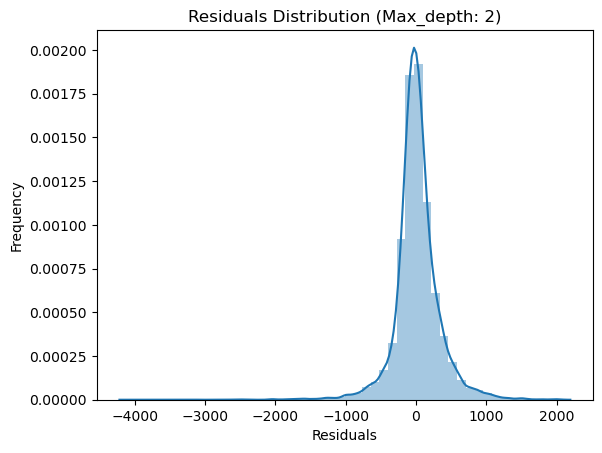

In [29]:
# חלוקת הנתונים לקבוצות על פי ערכי TTT
X_train = data_min_max_scaled[data_min_max_scaled['TTT_book'] >= 25].drop('price_diff', axis=1)
y_train = data_min_max_scaled[data_min_max_scaled['TTT_book'] >= 25]['price_diff']

X_test = data_min_max_scaled[data_min_max_scaled['TTT_book'] < 25].drop('price_diff', axis=1)
y_test = data_min_max_scaled[data_min_max_scaled['TTT_book'] < 25]['price_diff']

# Define the Gradient Boosting model
model = xgb.XGBRegressor(objective='reg:squarederror', n_estimators=100, max_depth=2)

# Train the model
model.fit(X_train, y_train)

# Make predictions
pred_train = model.predict(X_train)
pred_test = model.predict(X_test)

# Evaluate the model
print('Test MAE: ', "%.4f" % mean_absolute_error(y_test, pred_test))
print('Test MSE: ', "%.4f" % mean_squared_error(y_test, pred_test))
print('Test RMSE: ', "%.4f" % np.sqrt(mean_squared_error(y_test, pred_test)))
print('Test R2: ', "%.4f" % r2_score(y_test, pred_test))
print()
print('Train MAE: ', "%.4f" % mean_absolute_error(y_train, pred_train))
print('Train MSE: ', "%.4f" % mean_squared_error(y_train, pred_train))
print('Train RMSE: ', "%.4f" % np.sqrt(mean_squared_error(y_train, pred_train)))
print('Train R2: ', "%.4f" % r2_score(y_train, pred_train))

# Print scatter plot
plt.scatter(pred_train, y_train-pred_train, c='b',alpha=0.15)
plt.scatter(pred_test, y_test-pred_test, c='r',alpha=0.15)
plt.hlines(y=0,xmin=-500,xmax=500)
plt.show()
print()

# Print a histogram the residuals
sns.distplot(y_test-pred_test)
plt.title(f"Residuals Distribution (Max_depth: {2})")
plt.xlabel('Residuals')
plt.ylabel('Frequency')
plt.show()
print()

## Printing R^2 results

0.9232436115828515
0.9721361581278771


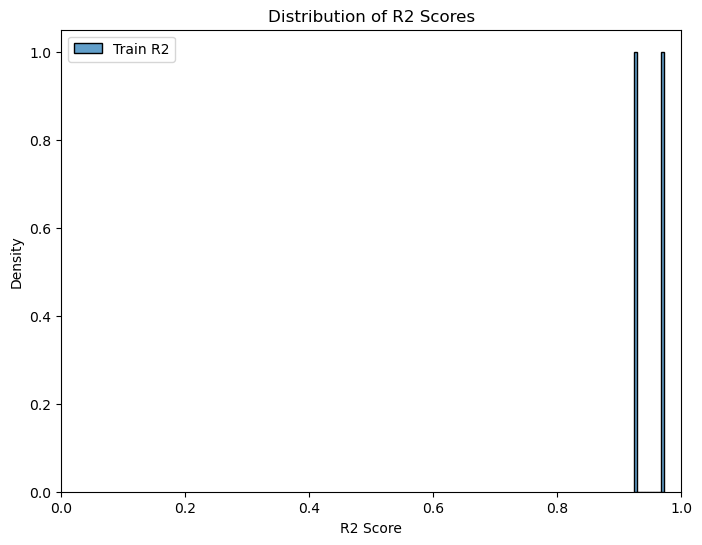

Text(0, 0.5, 'Density')

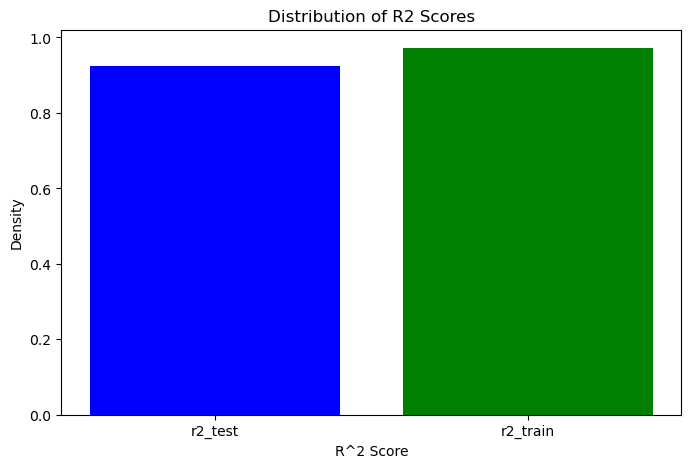

In [30]:
r2_test = r2_score(y_test, pred_test)
r2_train = r2_score(y_train,pred_train)

print(r2_test)
print(r2_train)

# צור גרף של התפלגות ה-R2
plt.figure(figsize=(8, 6))
sns.histplot([r2_train, r2_test], bins=10, edgecolor='black', alpha=0.7)
plt.title('Distribution of R2 Scores')
plt.xlabel('R2 Score')
plt.ylabel('Density')
plt.xlim(0, 1)  # הגבל את גבולות ה-x ל-R2 האפשריים (בין 0 ל-1)
plt.legend(['Train R2', 'Test R2'])
plt.show()

r2_scores = [r2_test, r2_train]
labels = ['r2_test', 'r2_train'] 
# יצירת גרף
plt.figure(figsize=(8, 5))
plt.bar(labels, r2_scores, color=['blue', 'green']) 
plt.title('Distribution of R2 Scores')
plt.xlabel('R^2 Score') 
plt.ylabel('Density')